In [ ]:
import torch
torch.__version__

'2.2.1+cu121'

In [ ]:
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import networkx as nx
import seaborn as sns
import scipy.sparse as sp
import requests
import re
import time
import random
import itertools
import os
os.environ["DGLBACKEND"] = "pytorch"

from collections import Counter
from matplotlib.lines import Line2D
from sklearn.preprocessing import StandardScaler
from sklearn.metrics import roc_auc_score
from sklearn.manifold import TSNE
from sklearn.cluster import SpectralClustering
from sklearn.cluster import KMeans
from sklearn.cluster import AffinityPropagation
from sklearn.cluster import MeanShift
from sklearn.cluster import AgglomerativeClustering
from sklearn.cluster import DBSCAN

import torch
import torch.nn as nn
import torch.optim as optim
import torch.nn.functional as F

import dgl
import dgl.data
import dgl.function as fn

In [ ]:
path1 = '/content/drive/MyDrive/Университет/Курсовая/data graph/Данные по компанием заполненные (1).xlsx'
path2 = '/content/drive/MyDrive/Университет/Курсовая/data graph/Степени связи для компаний.xlsx'

In [ ]:
data = pd.read_excel(path1, index_col = 'Unnamed: 0')
links = pd.read_excel(path2).drop(labels = ['Unnamed: 0', 'Unnamed: 0.1'], axis = 1)

In [ ]:
data = data.fillna(data.mean())
data_copy = data.copy()
columns_to_normalize = data.columns[1:]

scaler = StandardScaler()
data[columns_to_normalize] = scaler.fit_transform(data[columns_to_normalize])

In [ ]:
companies_lst = dict(np.concatenate(
    (links[['Проверяемые объекты', 'ИНН']],
     links[['Контрольные объекты', 'ИНН.1']])
  )) # dict | {name: inn}

In [ ]:
G = nx.from_pandas_edgelist(links, 'Проверяемые объекты', 'Контрольные объекты')

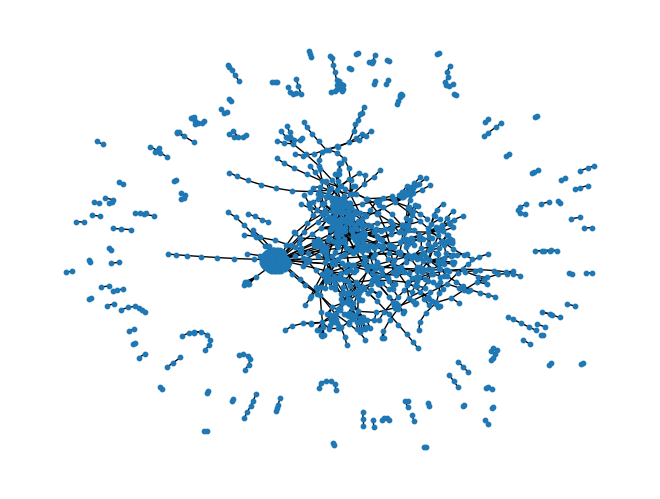

In [ ]:
nx.draw(G, node_size = 10, pos = nx.spring_layout(G))

In [ ]:
connected_components = list(nx.connected_components(G))
largest_component = max(connected_components, key=len)

G_con = G.subgraph(largest_component)
nodes_nx = list(G_con.nodes())

In [ ]:
# данные для каждого узла

data_to_dict = dict() # dict | {'название компании' : список данных}
for node in nodes_nx:
  feature = (data.where(
      data['INN'] == companies_lst[node])
      .dropna()
      .drop(labels = ['INN', 'Руководство - ИНН'], axis = 1)
      .values[0])

  data_to_dict[node] = torch.tensor(feature, dtype = torch.float)

nx.set_node_attributes(G = G_con, values = data_to_dict, name = 'data')

In [ ]:
# Перенесите граф из Networkx в DGL граф
G_dgl = dgl.from_networkx(G_con, node_attrs = ['data'])

In [ ]:
pos_main = nx.spring_layout(G_con)

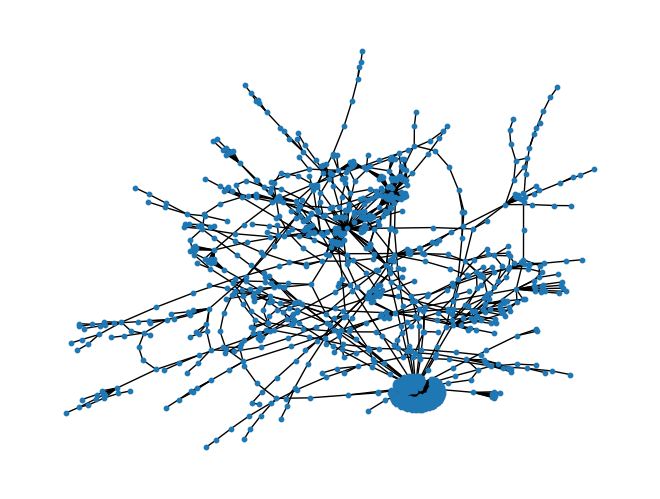

In [ ]:
nx.draw(G_con, node_size = 10, pos = pos_main)

In [ ]:
# матрица Лапласа
L = nx.laplacian_matrix(G_con).toarray()

# матрица смежности
adjacency_matrix = nx.adjacency_matrix(G_con).toarray()

In [ ]:
degrees = dict(G_con.degree())
tuple(dict(
    sorted(degrees.items(),
           key=lambda item: item[1],
           reverse = True)).items())[:10]

(('РОСИМУЩЕСТВО', 238),
 ('ООО "АГРОКОМПЛЕКС ЛАБИНСКИЙ"', 61),
 ('АО "СПЕЦИАЛИЗИРОВАННЫЙ ДЕПОЗИТАРИЙ "ИНФИНИТУМ"', 54),
 ('ЗАО "ПРСД"', 51),
 ('ПАО "ГАЗПРОМ"', 19),
 ('ПАО "ГАЗПРОМ НЕФТЬ"', 16),
 ('ГОСУДАРСТВЕННАЯ КОРПОРАЦИЯ "РОСТЕХ"', 16),
 ('ООО "СДК "ГАРАНТ"', 16),
 ('АО "ДК РЕГИОН"', 16),
 ('ПАО "ЛУКОЙЛ"', 15))

## **Лувенский алгоритм**

In [ ]:
communities_GMC = nx.community.louvain_communities(G_con)

In [ ]:
len(communities_GMC)

26

In [ ]:
communities_luv = dict()
for i in range(len(communities_GMC)):
  for j in communities_GMC[i]:
    communities_luv[j] = i

In [ ]:
community_colors = {}
for i, community_id in enumerate(set(communities_luv.values())):
    community_colors[community_id] = plt.cm.tab20(i % 20)

vis_G = nx.Graph()

for node in G_con.nodes():
    vis_G.add_node(node)

for edge in G_con.edges():
    u, v = edge
    community_u = communities_luv[u]
    community_v = communities_luv[v]
    if community_u == community_v:
        # If nodes are in the same community, color the edge and node green
        vis_G.add_edge(u, v, color=community_colors[community_u])
        vis_G.nodes[u]['color'] = community_colors[community_u]
        vis_G.nodes[v]['color'] = community_colors[community_u]
    else:
        vis_G.add_edge(u, v, color='black')

In [ ]:
pos = nx.spring_layout(vis_G)

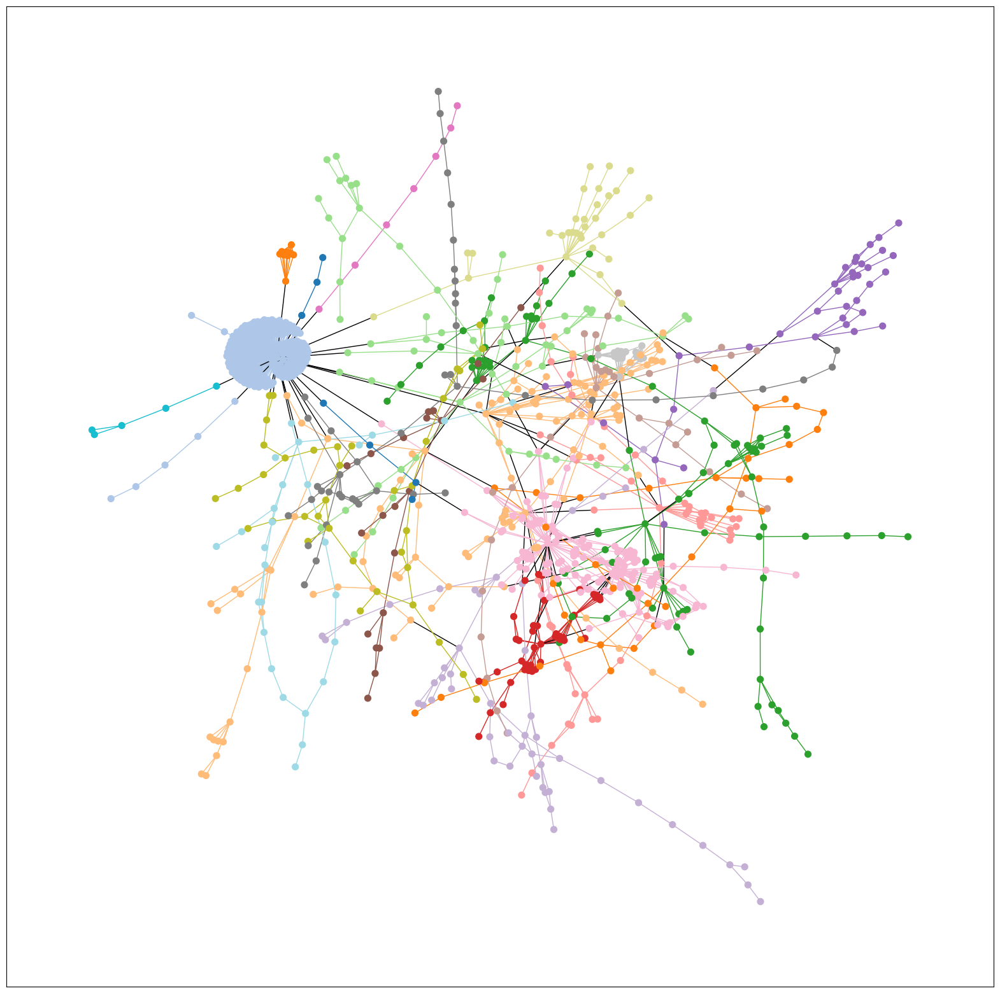

In [ ]:
plt.figure(figsize = (20, 20))

nx.draw_networkx(
    vis_G,
    pos,
    with_labels = False,
    node_color=[node[1]['color'] for node in vis_G.nodes(data=True)],
    node_size=50,
    edge_color=[edge[2]['color'] for edge in vis_G.edges(data=True)])
plt.show()

In [ ]:
# modularity
nx.community.modularity(G_con, communities_GMC)

0.8495011448589852

## Метод выделения сообществ на основе спектральной кластеризации

In [ ]:
sc = SpectralClustering(n_clusters=30,
                        affinity='precomputed',
                        random_state=80)

In [ ]:
sc.fit(adjacency_matrix)

SpectralClustering(affinity='precomputed', n_clusters=30, random_state=80)

In [ ]:
labels = sc.labels_
labels_sc = labels.copy()

In [ ]:
pd.DataFrame(Counter(labels).items()).sort_values(by=0).T

,13,19,14,4,28,0,29,24,18,8,...,11,5,17,2,10,7,21,12,27,23
0,0,1,2,3,4,5,6,7,8,9,...,20,21,22,23,24,25,26,27,28,29
1,33,26,190,34,8,276,11,8,18,7,...,16,16,29,111,39,17,17,11,16,22


Самая многочисленная группа это 5.

Самая малочисленная - 13, 9, 15, 7, 4

In [ ]:
res_df1 = pd.DataFrame({'company': list(G_con.nodes()), 'labels': labels})
res_df1['inn'] = res_df1['company'].apply(lambda x: companies_lst[x])

res_df1.head()

,company,labels,inn
0,РОСИМУЩЕСТВО,5,7710723134
1,"ООО ""ВАГРАН""",5,7707113058
2,"ООО ""ТЕХСЕРВИС""",5,2338012377
3,"ООО ""ТАУРОВСКИЙ УЧАСТОК""",5,7719473305
4,"ООО ""АГРОКОМПЛЕКС ""КАМЫШЕВАТСКИЙ""",5,2361010508


In [ ]:
cm = sns.light_palette('green', as_cmap = True)

In [ ]:
lst_inn = res_df1.where(res_df1['labels'] == 5).dropna()['inn'].values
data.where(data['INN'].isin(lst_inn)).dropna().describe().iloc[1:-1].style.background_gradient(cmap = cm)

,INN,Руководство - ИНН,"Возраст компании, лет",Принадлежность к госсектору,ИФР,Размер компании,"2022, Доходы, RUB","2023, Основные средства , RUB","2023, Чистые активы, RUB","2023, Активы всего, RUB","2023, Выручка, RUB","2023, Себестоимость продаж, RUB","2023, Валовая прибыль (убыток), RUB","2023, Прибыль (убыток) от продажи, RUB","2023, Проценты к получению, RUB","2023, Проценты к уплате, RUB","2023, Прибыль (убыток) до налогообложения , RUB","2023, Текущий налог на прибыль, RUB","2023, Чистая прибыль (убыток), RUB","2023, EBIT, RUB","2023, Поступления от текущих операций, RUB","2023, Поступления от продаж, RUB","2023, Поступление денежных средств всего, RUB","2023, Платежей всего, RUB","2023, Соотношение валовой прибыли к активам компании, %","2023, Cooтношение дебиторской задолженности к активам компании, %","2023, Доля рабочего капитала в активах компании, %","2023, Коэффициент оборачиваемости совокупных активов, %","2023, Коэффициент покрытия процентов по EBIT, %","2023, Соотношение чистого долга к капиталу, %","2023, Соотношение совокупного долга к EBIT, %","2023, Чистая норма прибыли, %","2022, Валовая рентабельность, %","2023, Валовая рентабельность, %","2023, Рентабельность продаж, %","2023, Доля себестоимости как процент от выручки, %","2023, Коэффициент текущей ликвидности, %","2023, Коэффициент быстрой ликвидности, %","2023, Коэффициент абсолютной ликвидности, %"
mean,6334603498.590580,-0.841266,-0.079864,0.239120,0.469150,0.138921,-0.193296,-0.025394,-0.045726,-0.045244,-0.057987,-0.079375,-0.038537,-0.027493,-0.024782,-0.056029,-0.023209,0.026720,-0.020811,-0.016811,-0.080337,-0.085371,-0.059422,-0.054022,-0.171288,0.135201,0.004757,-0.076241,-0.036110,-0.035442,0.043344,-0.026837,0.032428,-0.026962,0.035628,0.012899,-0.086960,-0.086237,-0.094885
std,2475518871.151619,1.041075,0.955420,1.234248,1.004592,0.909137,0.400237,0.254302,0.260920,0.320492,0.479140,0.476667,0.442378,0.454491,1.080454,0.594445,0.744906,0.766604,0.772890,0.674757,0.359540,0.315569,0.289666,0.291222,0.581040,1.076387,0.353915,0.036698,0.068120,0.013261,0.159270,0.012788,0.196295,0.892455,0.211869,0.881565,0.032413,0.032059,0.055824
min,1106025991.000000,-1.642332,-1.735021,-0.361499,-1.624102,-1.426819,-0.297513,-0.108235,-0.168498,-0.158858,-0.251927,-0.260179,-0.242935,-0.291365,-0.252293,-0.238244,-0.901505,-9.228794,-1.001374,-0.930821,-0.255210,-0.262485,-0.161826,-0.162550,-3.911611,-1.093330,-5.721555,-0.103283,-0.389494,-0.097126,-2.368665,-0.071288,-2.226352,-13.107193,-3.221722,-0.148976,-0.101431,-0.100376,-0.117398
25%,4579317200.500000,-1.624175,-0.851293,-0.361499,-0.087006,-0.361675,-0.297325,-0.108102,-0.125695,-0.158710,-0.251485,-0.259946,-0.221205,-0.171409,-0.251141,-0.238101,-0.203890,0.103601,-0.196803,-0.189443,-0.254010,-0.261003,-0.161344,-0.161969,-0.483662,-0.673456,0.036680,-0.099625,-0.047996,-0.039371,0.062274,-0.031887,0.055941,0.000000,0.057566,-0.118844,-0.101320,-0.100296,-0.117366
50%,7705191089.000000,-1.617449,-0.188497,-0.361499,0.926823,0.399142,-0.287840,-0.107454,-0.124950,-0.157099,-0.244727,-0.256757,-0.218568,-0.171262,-0.245928,-0.235437,-0.203240,0.220853,-0.196085,-0.188923,-0.250645,-0.249798,-0.159594,-0.159998,-0.255571,0.000000,0.037255,-0.090089,-0.047906,-0.039325,0.073090,-0.031878,0.058731,0.084696,0.067781,-0.113094,-0.101036,-0.100056,-0.116948
75%,7727486367.250000,0.034704,0.474299,-0.361499,1.384682,1.007796,-0.203501,-0.027772,-0.093580,-0.090510,0.000000,-0.088849,0.000000,-0.158062,0.000000,0.000000,-0.180687,0.222890,-0.174687,-0.171140,-0.000000,-0.000000,0.000000,0.000000,0.000000,0.195474,0.037376,-0.081607,-0.045852,-0.039005,0.073916,-0.031269,0.063771,0.094665,0.069243,-0.004474,-0.094958,-0.094257,-0.109846


In [ ]:
lst_inn = res_df1.where(res_df1['labels'] == 13).dropna()['inn'].values
print(lst_inn)
data.where(data['INN'].isin(lst_inn)).dropna().describe().iloc[1:-1].style.background_gradient(cmap = cm)

[2.63210074e+09 1.64400384e+09 1.65301028e+09 7.72813159e+09
 7.71034949e+09 1.65520238e+09]


,INN,Руководство - ИНН,"Возраст компании, лет",Принадлежность к госсектору,ИФР,Размер компании,"2022, Доходы, RUB","2023, Основные средства , RUB","2023, Чистые активы, RUB","2023, Активы всего, RUB","2023, Выручка, RUB","2023, Себестоимость продаж, RUB","2023, Валовая прибыль (убыток), RUB","2023, Прибыль (убыток) от продажи, RUB","2023, Проценты к получению, RUB","2023, Проценты к уплате, RUB","2023, Прибыль (убыток) до налогообложения , RUB","2023, Текущий налог на прибыль, RUB","2023, Чистая прибыль (убыток), RUB","2023, EBIT, RUB","2023, Поступления от текущих операций, RUB","2023, Поступления от продаж, RUB","2023, Поступление денежных средств всего, RUB","2023, Платежей всего, RUB","2023, Соотношение валовой прибыли к активам компании, %","2023, Cooтношение дебиторской задолженности к активам компании, %","2023, Доля рабочего капитала в активах компании, %","2023, Коэффициент оборачиваемости совокупных активов, %","2023, Коэффициент покрытия процентов по EBIT, %","2023, Соотношение чистого долга к капиталу, %","2023, Соотношение совокупного долга к EBIT, %","2023, Чистая норма прибыли, %","2022, Валовая рентабельность, %","2023, Валовая рентабельность, %","2023, Рентабельность продаж, %","2023, Доля себестоимости как процент от выручки, %","2023, Коэффициент текущей ликвидности, %","2023, Коэффициент быстрой ликвидности, %","2023, Коэффициент абсолютной ликвидности, %"
mean,3837133053.500000,-0.480687,0.345422,2.244964,0.205480,-0.108069,-0.093294,0.055686,0.260297,0.219994,0.497795,0.431618,0.646461,0.835533,0.200365,0.067608,1.106627,-1.949676,0.986736,1.099777,0.830692,0.803201,0.270807,0.288182,-0.341997,-0.388448,0.031189,-0.083547,0.130547,-0.032639,0.069359,-0.021375,0.046544,0.067941,0.042583,-0.089626,0.105573,0.106633,0.692087
std,3031000084.462199,0.944703,0.753817,1.276901,1.024238,0.975113,0.205750,0.326965,0.744893,0.683258,1.714375,1.568101,2.020678,2.401018,0.574863,0.428333,2.776746,4.835917,2.480061,2.749629,2.533390,2.481642,0.874633,0.918538,0.257528,0.693671,0.015280,0.041299,0.410866,0.015991,0.059788,0.014641,0.023229,0.035455,0.033514,0.045038,0.454456,0.455159,1.910288
min,1644003838.000000,-1.624159,-0.298963,-0.361499,-1.329765,-1.426819,-0.297249,-0.108234,-0.125650,-0.158694,-0.251910,-0.260158,-0.225853,-0.204783,-0.251642,-0.238228,-0.203876,-11.813483,-0.196675,-0.189524,-0.255192,-0.262485,-0.161815,-0.162519,-0.517527,-1.069645,0.000000,-0.103283,-0.048054,-0.039354,-0.000000,-0.031896,0.000000,0.000000,-0.001015,-0.120511,-0.101345,-0.100289,-0.117257
25%,1653558308.000000,-1.097424,-0.298963,2.766256,-0.457705,-0.666002,-0.212909,-0.108081,-0.084041,-0.058762,-0.251714,-0.260084,-0.221691,-0.174064,-0.158755,-0.237707,-0.175459,-0.232707,-0.175655,-0.165109,-0.254822,-0.262150,-0.135152,-0.135662,-0.509031,-0.931485,0.037261,-0.103117,-0.047688,-0.039326,0.041287,-0.031876,0.050307,0.064632,0.015118,-0.111288,-0.100605,-0.099609,-0.115862
50%,2143651558.500000,-0.650640,0.198134,2.766256,0.512468,-0.209511,-0.158794,-0.083438,-0.024646,-0.034238,-0.250326,-0.257740,-0.220425,-0.170746,-0.072294,-0.118257,-0.080615,0.010360,-0.087741,-0.080022,-0.251660,-0.260095,-0.065445,-0.065346,-0.502003,-0.493672,0.037465,-0.102801,-0.044633,-0.039184,0.064384,-0.029474,0.054417,0.081008,0.061439,-0.107610,-0.096945,-0.096064,-0.101772
75%,6440787305.500000,0.196622,0.778080,2.766256,1.049464,0.703469,-0.029969,-0.014735,0.043103,-0.005673,-0.062378,-0.063899,-0.054791,-0.042435,0.406310,0.214130,0.323483,0.141714,0.332603,0.316781,-0.062369,-0.064738,0.003008,0.001642,-0.139809,-0.090305,0.037495,-0.092583,-0.010448,-0.038852,0.073041,-0.010914,0.058443,0.089235,0.063704,-0.094034,-0.023626,-0.023447,-0.022810


In [ ]:
lst_inn = res_df1.where(res_df1['labels'] == 0).dropna()['inn'].values
data_copy.where(data['INN'].isin(lst_inn)).dropna()[['2023, Чистые активы, RUB', '2023, Коэффициент текущей ликвидности, %']].mean().values

array([3.80905435e+10, 3.11862779e+02])

In [ ]:
res = []
for i in range(30):
  lst_inn = res_df1.where(res_df1['labels'] == i).dropna()['inn'].values
  res.append(data_copy.where(data['INN'].isin(lst_inn)).dropna()[['2023, Чистые активы, RUB', '2023, Коэффициент текущей ликвидности, %']].mean().values)

In [ ]:
pd.DataFrame(res, columns = ['Среднее значение Чистая Прибыль',
                             'Среднее значение Коэф. Текущей Ликвидности'])

,Среднее значение Чистая Прибыль,Среднее значение Коэф. Текущей Ликвидности
0,3.809054e+10,311.862779
1,1.375893e+11,155.499654
2,5.872211e+10,1087.337639
3,3.199590e+10,37.834552
4,5.728425e+07,445.896913
5,3.908233e+10,66.176962
6,1.410842e+10,182.026364
7,8.129824e+09,60.669278
8,2.598691e+10,254.300854
9,2.315813e+10,139.197294


In [ ]:
# новый граф с назначениями сообщества

communities_spectral = {}
for node, label in zip(G_con.nodes(), labels):
    if label not in communities_spectral:
        communities_spectral[label] = []
    communities_spectral[label].append(node)

In [ ]:
# modularity
nx.community.modularity(G_con, communities_spectral.values())

0.8148843847434809

In [ ]:
# покрытие, эффективность

coverage, performance = nx.community.partition_quality(
    G = G_con,
    partition = communities_spectral.values()
)

coverage, performance

(0.9523809523809523, 0.8844477120460594)

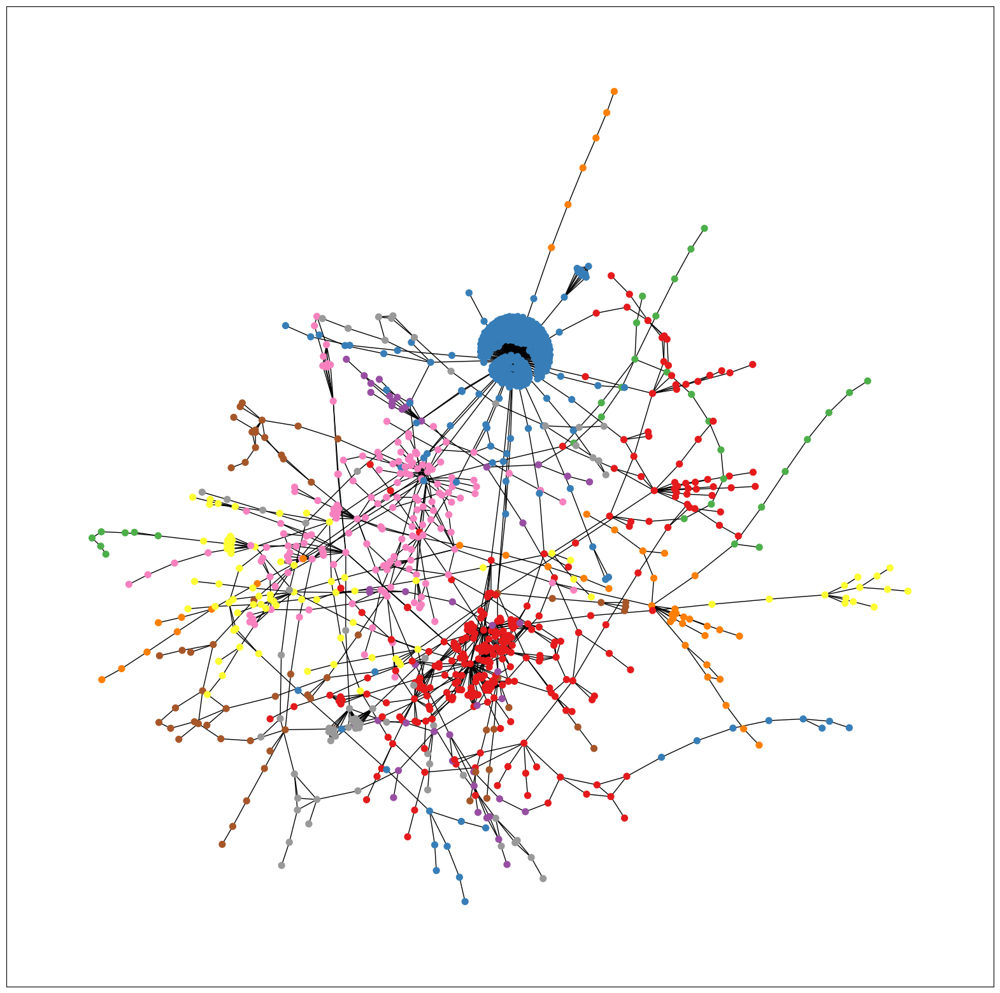

In [ ]:
plt.figure(figsize = (20, 20))
nx.draw_networkx(G = G_con, pos = pos,
                 with_labels = False,
                 node_color = list(labels),
                 node_size = 50,
                 cmap = plt.cm.Set1)

plt.show()

## K-Means

In [ ]:
mod = []
for k in range(5, 50):
  kmeans = KMeans(n_clusters=k, random_state = 42, algorithm = 'elkan').fit(adjacency_matrix)
  labels = kmeans.labels_
  communities = {}
  for node, label in zip(G_con.nodes(), labels):
    if label not in communities:
      communities[label] = []
    communities[label].append(node)

  # modularity
  mod.append(nx.community.modularity(G_con, communities.values()))

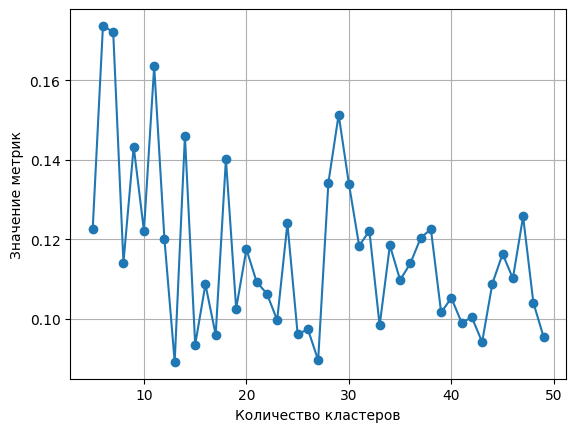

In [ ]:
plt.plot(range(5, 50), mod, '-o')
plt.xlabel('Количество кластеров')
plt.ylabel('Значение метрик')
plt.grid()
plt.show()

In [ ]:
# выберем n_clusters = 6

In [ ]:
kmeans = KMeans(n_clusters=6, random_state = 42, algorithm='elkan')
labels = kmeans.fit_predict(adjacency_matrix)
print(Counter(labels))

/usr/local/lib/python3.10/dist-packages/sklearn/cluster/_kmeans.py:870: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  warnings.warn(


Counter({0: 813, 3: 238, 4: 12, 1: 7, 5: 6, 2: 1})


In [ ]:
res_df2 = pd.DataFrame({'company': list(G_con.nodes()), 'labels': labels})
res_df2['inn'] = res_df2['company'].apply(lambda x: companies_lst[x])

In [ ]:
# росимущество к классу 3, а не к отдельному классу
res_df2['labels'].iloc[0] = 3

In [ ]:
# res_df2.where(res_df2['labels']==9).dropna() # 9

# lst_1 = list(links.where(
#     links['ИНН']==res_df2.where(res_df2['labels']==2).dropna()['inn'].values[0]
#   ).dropna()['Контрольные объекты'])

# res_df2.where(res_df2['company'].isin(lst_1)).dropna()

In [ ]:
# список компаний, которые принадлежат группе 13
# res_df2.where(res_df2['labels'] == 0).dropna()

In [ ]:
cm = sns.light_palette('green', as_cmap = True)

In [ ]:
lst_inn = res_df2.where(res_df2['labels'] == 0).dropna()['inn'].values
data.where(data['INN'].isin(lst_inn)).dropna().describe().iloc[1:-1].style.background_gradient(cmap = cm)

,INN,Руководство - ИНН,"Возраст компании, лет",Принадлежность к госсектору,ИФР,Размер компании,"2022, Доходы, RUB","2023, Основные средства , RUB","2023, Чистые активы, RUB","2023, Активы всего, RUB","2023, Выручка, RUB","2023, Себестоимость продаж, RUB","2023, Валовая прибыль (убыток), RUB","2023, Прибыль (убыток) от продажи, RUB","2023, Проценты к получению, RUB","2023, Проценты к уплате, RUB","2023, Прибыль (убыток) до налогообложения , RUB","2023, Текущий налог на прибыль, RUB","2023, Чистая прибыль (убыток), RUB","2023, EBIT, RUB","2023, Поступления от текущих операций, RUB","2023, Поступления от продаж, RUB","2023, Поступление денежных средств всего, RUB","2023, Платежей всего, RUB","2023, Соотношение валовой прибыли к активам компании, %","2023, Cooтношение дебиторской задолженности к активам компании, %","2023, Доля рабочего капитала в активах компании, %","2023, Коэффициент оборачиваемости совокупных активов, %","2023, Коэффициент покрытия процентов по EBIT, %","2023, Соотношение чистого долга к капиталу, %","2023, Соотношение совокупного долга к EBIT, %","2023, Чистая норма прибыли, %","2022, Валовая рентабельность, %","2023, Валовая рентабельность, %","2023, Рентабельность продаж, %","2023, Доля себестоимости как процент от выручки, %","2023, Коэффициент текущей ликвидности, %","2023, Коэффициент быстрой ликвидности, %","2023, Коэффициент абсолютной ликвидности, %"
mean,6872086436.976886,0.215910,0.157899,0.076082,-0.109378,0.068159,0.090726,0.013421,0.019516,0.037768,0.049050,0.054189,0.039269,0.066587,0.069428,0.070583,0.041213,-0.058209,0.039245,0.055780,0.034045,0.020330,0.039219,0.038213,-0.005122,-0.106192,0.026529,0.071059,-0.012242,0.030558,-0.016338,0.024828,-0.026461,0.000425,0.021778,-0.006322,0.065146,0.065112,0.047582
std,2076848067.129363,0.902492,0.976929,1.085635,0.909279,1.058261,1.109641,0.759735,0.568705,0.795284,1.147436,1.136517,1.193780,1.323245,1.104559,1.207430,1.017033,1.112311,1.024604,1.267838,0.842840,0.739536,1.276590,1.277211,0.859736,0.805381,0.030171,1.388282,0.158458,1.390234,1.343560,1.391818,1.372637,1.148437,0.291839,1.132293,1.371404,1.373128,1.166463
min,1102024468.000000,-1.644557,-1.735021,-0.361499,-1.656806,-1.426819,-0.297513,-0.108235,-0.184447,-0.158858,-0.251927,-0.260179,-0.506785,-0.835950,-0.252294,-0.238244,-2.285270,-16.503552,-2.523378,-2.406174,-0.255210,-0.262485,-0.161826,-0.162550,-5.008979,-1.093753,-0.301419,-0.103283,-0.389494,-1.568229,-33.514125,-0.044614,-38.795206,-32.303409,-3.221722,-0.149074,-0.101431,-0.100376,-0.117398
25%,6163633176.750000,-0.202908,-0.519895,-0.361499,-0.937314,-1.426819,-0.283089,-0.107707,-0.123748,-0.155338,-0.248187,-0.256681,-0.218667,-0.171340,-0.247504,-0.233781,-0.203266,0.000000,-0.196037,-0.188930,-0.251688,-0.257971,-0.159538,-0.160268,-0.379694,-0.685510,0.036537,-0.097238,-0.047934,-0.039366,-0.000000,-0.031878,0.000000,0.000000,-0.000000,-0.117809,-0.101189,-0.100158,-0.117158
50%,7706651991.000000,0.587275,0.253367,-0.361499,-0.000000,1.007796,-0.133411,-0.103354,-0.085493,-0.084966,-0.098127,-0.054515,-0.177200,-0.122229,-0.153567,-0.125311,-0.105231,0.093631,-0.108635,-0.085444,-0.096199,-0.222833,-0.091957,-0.092705,0.000000,-0.137784,0.037333,-0.090012,-0.047506,-0.039316,0.066408,-0.031876,0.058749,0.085715,0.068939,-0.111147,-0.100187,-0.099237,-0.114432
75%,7728970609.250000,0.942460,0.805697,-0.361499,0.624310,1.007796,0.000000,0.000000,0.000000,-0.000000,0.000000,-0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.222638,0.000000,0.000000,-0.000000,-0.000000,0.000000,0.000000,0.099281,0.000000,0.037424,0.000000,0.000000,0.000000,0.074203,-0.010415,0.064590,0.098064,0.069250,0.000000,0.000000,-0.000000,0.000000


In [ ]:
lst_inn = res_df2.where(res_df2['labels'] == 3).dropna()['inn'].values
data.where(data['INN'].isin(lst_inn)).dropna().describe().iloc[1:-1].style.background_gradient(cmap = cm)

,INN,Руководство - ИНН,"Возраст компании, лет",Принадлежность к госсектору,ИФР,Размер компании,"2022, Доходы, RUB","2023, Основные средства , RUB","2023, Чистые активы, RUB","2023, Активы всего, RUB","2023, Выручка, RUB","2023, Себестоимость продаж, RUB","2023, Валовая прибыль (убыток), RUB","2023, Прибыль (убыток) от продажи, RUB","2023, Проценты к получению, RUB","2023, Проценты к уплате, RUB","2023, Прибыль (убыток) до налогообложения , RUB","2023, Текущий налог на прибыль, RUB","2023, Чистая прибыль (убыток), RUB","2023, EBIT, RUB","2023, Поступления от текущих операций, RUB","2023, Поступления от продаж, RUB","2023, Поступление денежных средств всего, RUB","2023, Платежей всего, RUB","2023, Соотношение валовой прибыли к активам компании, %","2023, Cooтношение дебиторской задолженности к активам компании, %","2023, Доля рабочего капитала в активах компании, %","2023, Коэффициент оборачиваемости совокупных активов, %","2023, Коэффициент покрытия процентов по EBIT, %","2023, Соотношение чистого долга к капиталу, %","2023, Соотношение совокупного долга к EBIT, %","2023, Чистая норма прибыли, %","2022, Валовая рентабельность, %","2023, Валовая рентабельность, %","2023, Рентабельность продаж, %","2023, Доля себестоимости как процент от выручки, %","2023, Коэффициент текущей ликвидности, %","2023, Коэффициент быстрой ликвидности, %","2023, Коэффициент абсолютной ликвидности, %"
mean,6257870788.987500,-0.936763,-0.105454,0.172826,0.552500,0.143001,-0.207486,0.107069,0.095074,0.071665,0.019778,-0.003014,0.025382,-0.062298,-0.000332,-0.019275,0.031784,-0.004586,0.029350,-0.007192,0.036804,0.047367,-0.003298,0.003190,-0.219013,0.183260,0.000512,-0.075946,-0.034892,-0.035353,0.046598,-0.027053,0.029175,-0.043593,0.032887,0.029930,-0.087572,-0.086743,-0.095896
std,2546523304.669840,1.000643,0.930877,1.179632,0.963263,0.875493,0.292669,2.135550,2.310242,2.077928,1.254490,1.275376,1.095763,0.548389,1.395119,1.161253,1.359209,0.821462,1.347038,0.719854,1.864188,1.937968,0.884240,0.880811,0.536688,1.081209,0.379425,0.036690,0.067491,0.012735,0.167001,0.012216,0.210165,0.956075,0.226878,0.944280,0.031928,0.031599,0.054499
min,1106025991.000000,-1.642332,-1.624555,-0.361499,-1.624102,-1.426819,-0.297513,-0.108235,-0.168498,-0.158858,-0.251927,-0.260179,-0.242935,-5.961860,-0.252293,-0.238244,-0.901505,-9.228794,-1.001374,-0.930821,-0.255210,-0.262485,-0.161826,-0.162550,-3.911611,-1.093330,-5.721555,-0.103283,-0.082252,-0.097126,-2.368665,-0.071288,-2.226352,-13.107193,-3.221722,-0.148976,-0.101431,-0.100376,-0.117398
25%,3330580059.500000,-1.642332,-0.851293,-0.361499,-0.005399,-0.209511,-0.297413,-0.108036,-0.125702,-0.158756,-0.251537,-0.259957,-0.221364,-0.171419,-0.251031,-0.238089,-0.204057,0.154601,-0.196934,-0.189724,-0.253682,-0.260542,-0.161361,-0.162002,-0.483662,-0.622915,0.036680,-0.099625,-0.047997,-0.039375,0.069394,-0.031886,0.055726,0.000000,0.057566,-0.116968,-0.101318,-0.100296,-0.117362
50%,7705191089.000000,-1.617450,-0.188497,-0.361499,1.155753,0.399142,-0.291407,-0.107482,-0.125212,-0.157485,-0.245811,-0.257031,-0.219307,-0.171328,-0.244591,-0.235830,-0.203363,0.221149,-0.196142,-0.188943,-0.250645,-0.249798,-0.159594,-0.159998,-0.255571,0.000000,0.037245,-0.090089,-0.047917,-0.039325,0.073165,-0.031878,0.058731,0.084696,0.067570,-0.111856,-0.101054,-0.100061,-0.116937
75%,7725432018.250000,-0.000000,0.474299,-0.361499,1.417386,1.007796,-0.239273,0.000000,-0.118845,-0.117133,0.000000,-0.169613,0.000000,-0.166476,0.000000,0.000000,-0.197889,0.222890,-0.191120,-0.183530,-0.000000,-0.000000,0.000000,0.000000,0.000000,0.298142,0.037379,-0.081006,-0.044283,-0.039005,0.073916,-0.031269,0.063218,0.091898,0.069189,0.000000,-0.096078,-0.095169,-0.109846


In [ ]:
labels = res_df2['labels'].values

In [ ]:
communities = {}
for node, label in zip(G_con.nodes(), labels):
    if label not in communities:
        communities[label] = []
    communities[label].append(node)

# modularity
nx.community.modularity(G_con, communities.values()) # увеличилась с 0.17 до 0.32

0.32326903743268137

In [ ]:
# покрытие, эффективность

coverage, performance = nx.community.partition_quality(
    G = G_con,
    partition = communities.values()
)

coverage, performance

(0.9196428571428571, 0.38302216331334804)

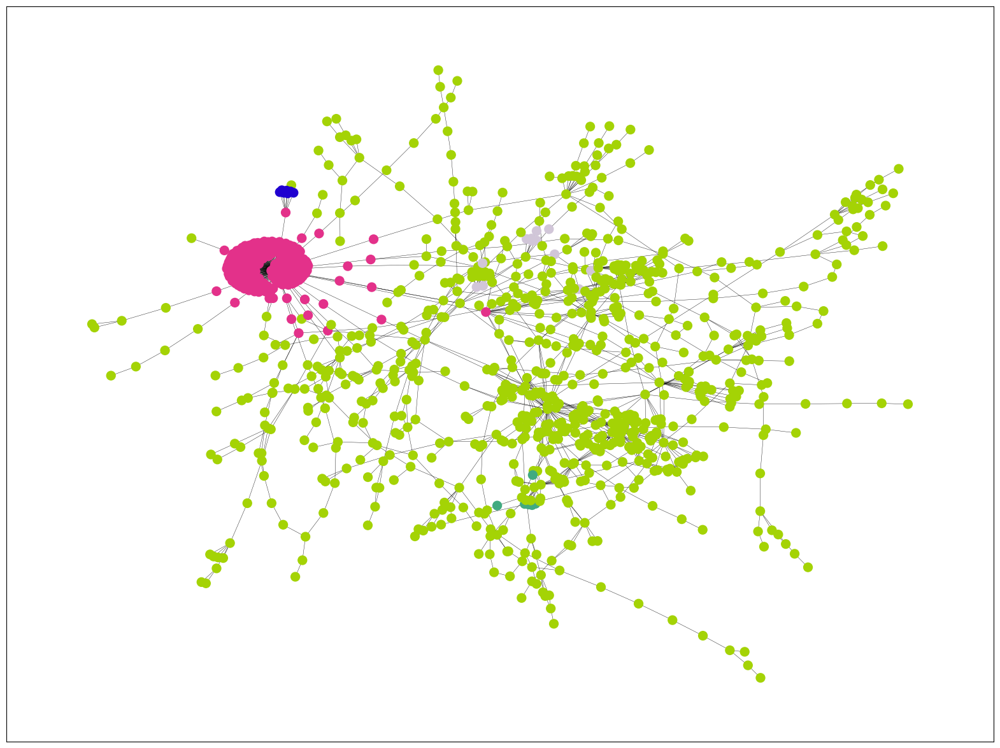

In [ ]:
plt.figure(figsize = (20, 15))
nodes_draw = nx.draw_networkx_nodes(G = G_con, pos = pos,
                       node_color = [mapping_colors[i] for i in labels],
                       node_size = 100)

edges_draw = nx.draw_networkx_edges(G = G_con, pos = pos, width = 0.3)

In [ ]:
lst_inn = res_df2.where(res_df2['labels'] == 0).dropna()['inn'].values
dfd_1 = data.where(data['INN'].isin(lst_inn)).dropna()[['2023, Чистая прибыль (убыток), RUB', '2023, EBIT, RUB', '2023, Выручка, RUB', '2023, Валовая рентабельность, %', '2023, Коэффициент текущей ликвидности, %']].describe().iloc[1:3]

lst_inn = res_df2.where(res_df2['labels'] == 1).dropna()['inn'].values
dfd_2 = data.where(data['INN'].isin(lst_inn)).dropna()[['2023, Чистая прибыль (убыток), RUB', '2023, EBIT, RUB', '2023, Выручка, RUB', '2023, Валовая рентабельность, %', '2023, Коэффициент текущей ликвидности, %']].describe().iloc[1:3]

lst_inn = res_df2.where(res_df2['labels'] == 3).dropna()['inn'].values
dfd_3 = data.where(data['INN'].isin(lst_inn)).dropna()[['2023, Чистая прибыль (убыток), RUB', '2023, EBIT, RUB', '2023, Выручка, RUB', '2023, Валовая рентабельность, %', '2023, Коэффициент текущей ликвидности, %']].describe().iloc[1:3]

lst_inn = res_df2.where(res_df2['labels'] == 4).dropna()['inn'].values
dfd_4 = data.where(data['INN'].isin(lst_inn)).dropna()[['2023, Чистая прибыль (убыток), RUB', '2023, EBIT, RUB', '2023, Выручка, RUB', '2023, Валовая рентабельность, %', '2023, Коэффициент текущей ликвидности, %']].describe().iloc[1:3]

lst_inn = res_df2.where(res_df2['labels'] == 5).dropna()['inn'].values
dfd_5 = data.where(data['INN'].isin(lst_inn)).dropna()[['2023, Чистая прибыль (убыток), RUB', '2023, EBIT, RUB', '2023, Выручка, RUB', '2023, Валовая рентабельность, %', '2023, Коэффициент текущей ликвидности, %']].describe().iloc[1:3]

In [ ]:
pd.concat([dfd_1, dfd_2, dfd_3, dfd_4, dfd_5], keys = [0, 1, 3, 4, 5]).style.background_gradient(cmap = cm)

## **Node2Vec**

In [ ]:
!pip install node2vec

In [ ]:
from node2vec import Node2Vec

In [ ]:
node2vec = Node2Vec(G_con, dimensions=32, walk_length=5, num_walks=1000, p=1, q=2)

Computing transition probabilities:   0%|          | 0/1077 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████| 1000/1000 [01:23<00:00, 11.92it/s]


In [ ]:
model = node2vec.fit(window=3, epochs=7)

In [ ]:
emb = np.array([model.wv[str(node)] for node in G_con.nodes()])

In [ ]:
emb.shape

(1077, 32)

In [ ]:
# pos на основе embeddings после модели GCN
tsne = TSNE(n_components = 2)
pos_embeddings = tsne.fit_transform(emb)
pos_emb = dict(zip(G_con.nodes, pos_embeddings))

In [ ]:
data_for_model = torch.stack(list(nx.get_node_attributes(G = G_con, name = 'data').values()))

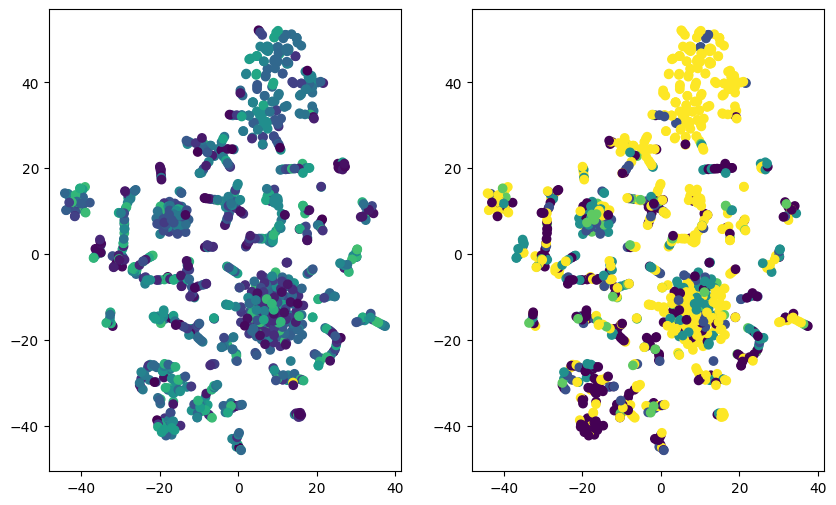

In [ ]:
plt.figure(figsize=(10, 6))
plt.subplot(121)
# по возрасту компании
plt.scatter(pos_embeddings[:, 0], pos_embeddings[:, 1], c = data_for_model[:, 0])

plt.subplot(122)
# размер компании
plt.scatter(pos_embeddings[:, 0], pos_embeddings[:, 1], c = data_for_model[:, 3])
plt.show()

In [ ]:
# цвета
color_map_3 = []
for i in range(50):
    color_map_3.append('#%06x' % random.randint(0, 0xFFFFFF))

mapping_colors = {i: color for i, color in enumerate(color_map_3)}

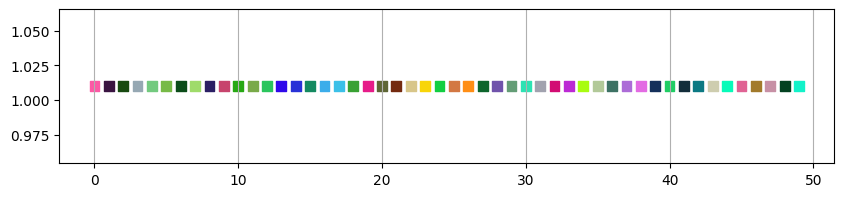

In [ ]:
plt.figure(figsize = (10, 2))
x = range(50)
y = [1.01 for i in range(50)]

plt.scatter(x, y, color=color_map_3, s=50, marker = 's')
plt.grid(axis = 'x')
plt.show()

Методы для кластеразации:
* K-Means
* Affinity propagation
* Mean-shift

**AffinityPropagation**

In [ ]:
Preference = [-400, -350, -200, -150, -100, -80, -50, -30, -25]
mod = []
number_clusters = []
for preference in Preference:
    model = AffinityPropagation(preference=preference, random_state=42)
    model.fit(emb)
    labels = model.labels_

    communities = {}
    for node, label in zip(G_con.nodes(), labels):
      if label not in communities:
        communities[label] = []
      communities[label].append(node)
    number_clusters.append(len(communities))
    # modularity
    mod.append(nx.community.modularity(G_con, communities.values()))

/usr/local/lib/python3.10/dist-packages/sklearn/cluster/_affinity_propagation.py:143: ConvergenceWarning: Affinity propagation did not converge, this model may return degenerate cluster centers and labels.
  warnings.warn(


In [ ]:
number_clusters

[8, 10, 19, 29, 44, 57, 73, 105, 127]

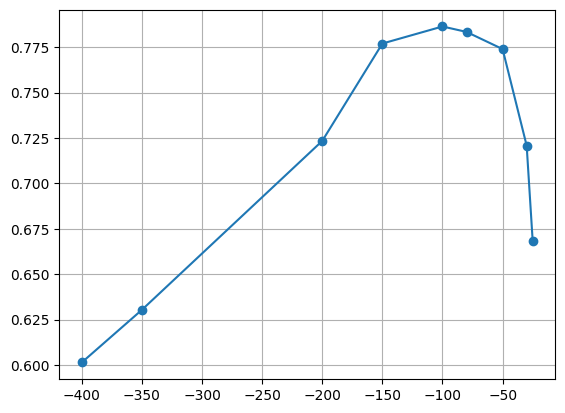

In [ ]:
plt.plot(Preference, mod, '-o')
plt.grid()
plt.show()

In [ ]:
# выберем preference = -500 при котором 18 кластера

In [ ]:
# n_clusters = 44
af = AffinityPropagation(
    preference= -100,
    random_state=42).fit(emb)

labels = af.labels_
print(Counter(labels))

Counter({1: 189, 28: 72, 14: 70, 0: 62, 6: 38, 20: 35, 22: 32, 12: 31, 8: 28, 16: 27, 29: 27, 40: 25, 38: 24, 3: 23, 31: 21, 7: 18, 11: 18, 21: 18, 17: 17, 4: 17, 36: 17, 2: 16, 15: 16, 25: 16, 5: 15, 18: 15, 34: 15, 13: 14, 30: 14, 24: 13, 32: 12, 35: 11, 41: 11, 42: 11, 19: 11, 23: 10, 33: 10, 9: 9, 10: 9, 43: 9, 39: 9, 37: 9, 27: 7, 26: 6})


In [ ]:
communities = {}
for node, label in zip(G_con.nodes(), labels):
    if label not in communities:
        communities[label] = []
    communities[label].append(node)

# modularity
nx.community.modularity(G_con, communities.values())

0.7864237329046202

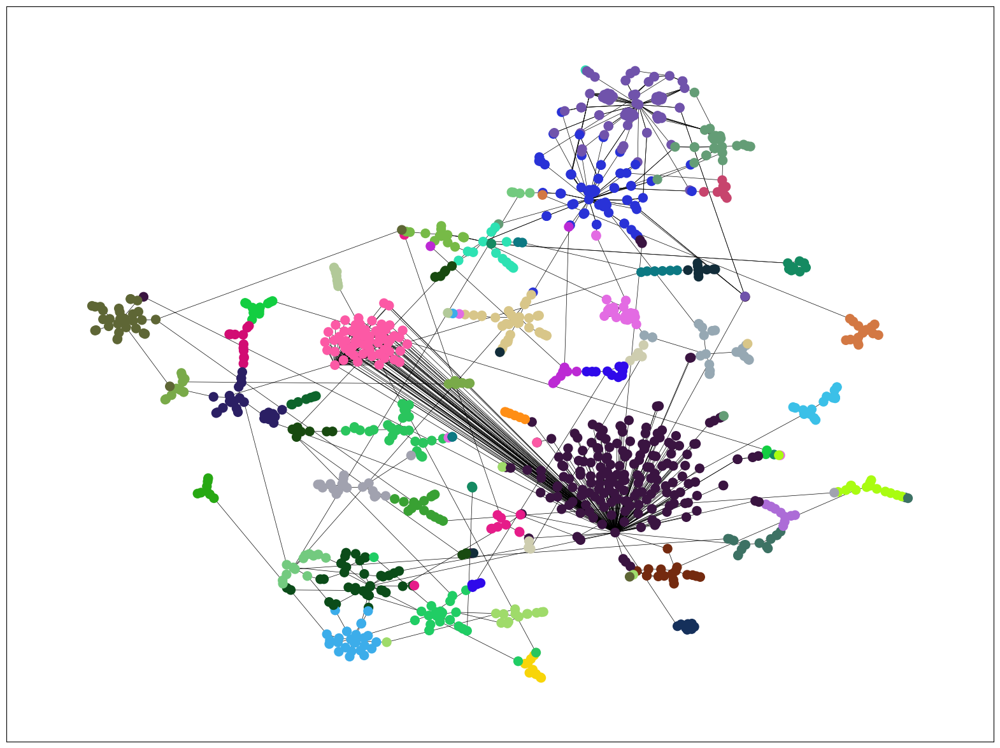

In [ ]:
plt.figure(figsize = (20, 15))
nodes_draw = nx.draw_networkx_nodes(G = G_con, pos = pos_emb,
                       node_color = [mapping_colors[i] for i in labels],
                       node_size = 100)

edges_draw = nx.draw_networkx_edges(G = G_con, pos = pos_emb, width = 0.5)

**KMeans**

In [ ]:
mod = []
for k in range(1, 40, 2):
  kmeans = KMeans(n_clusters=k, random_state = 42, algorithm = 'elkan').fit(emb)
  labels = kmeans.labels_
  communities = {}
  for node, label in zip(G_con.nodes(), labels):
    if label not in communities:
      communities[label] = []
    communities[label].append(node)

  # modularity
  mod.append(nx.community.modularity(G_con, communities.values()))

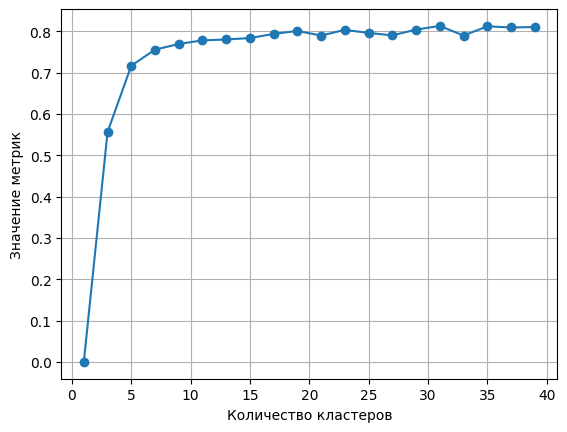

In [ ]:
plt.plot(range(1, 40, 2), mod, '-o') #21
plt.xlabel('Количество кластеров')
plt.ylabel('Значение метрик')
plt.grid()
plt.show()

In [ ]:
# выберем n_clusters = 19

In [ ]:
kmeans = KMeans(n_clusters=19, random_state = 42, algorithm='elkan')
labels = kmeans.fit_predict(emb)
print(Counter(labels))

/usr/local/lib/python3.10/dist-packages/sklearn/cluster/_kmeans.py:870: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  warnings.warn(


Counter({3: 245, 4: 85, 13: 79, 10: 76, 1: 69, 14: 55, 18: 49, 9: 49, 12: 49, 8: 47, 6: 46, 16: 38, 15: 32, 17: 32, 5: 31, 11: 30, 7: 29, 2: 24, 0: 12})


In [ ]:
# labels = res_df['labels'].values

communities = {}
for node, label in zip(G_con.nodes(), labels):
    if label not in communities:
        communities[label] = []
    communities[label].append(node)

# modularity
nx.community.modularity(G_con, communities.values())

0.8010951450892857

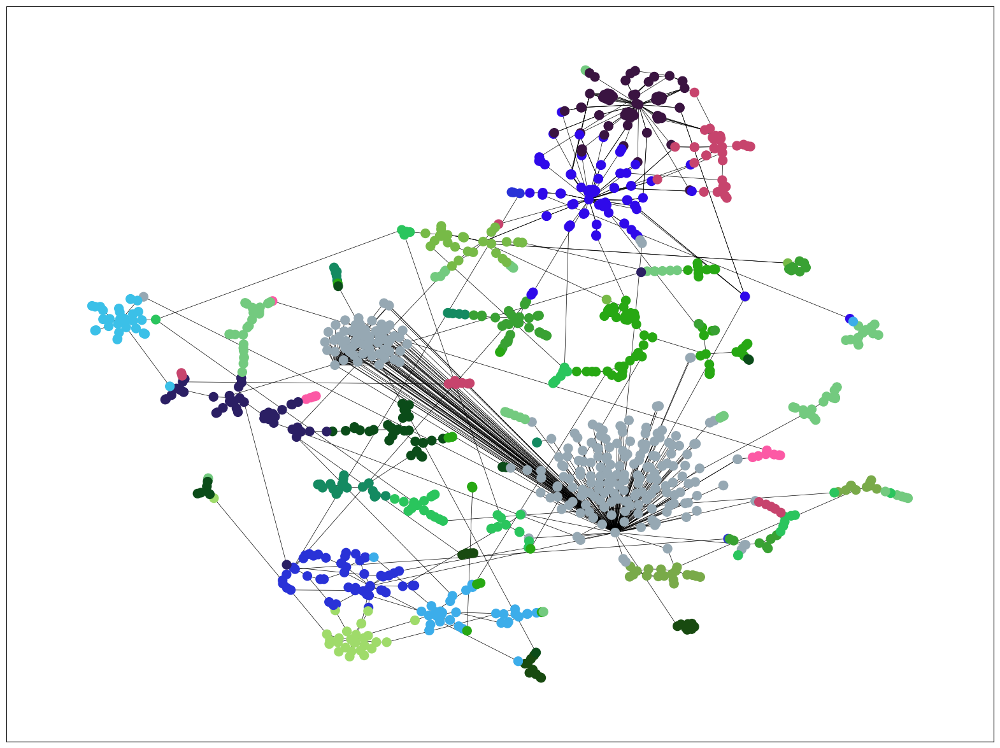

In [ ]:
plt.figure(figsize = (20, 15))
nodes_draw = nx.draw_networkx_nodes(G = G_con, pos = pos_emb,
                       node_color = [mapping_colors[i] for i in labels],
                       node_size = 100)

edges_draw = nx.draw_networkx_edges(G = G_con, pos = pos_emb, width = 0.5)

**DBSCAN**

In [ ]:
!pip install kneed

4.722498737292629


<Figure size 500x500 with 0 Axes>

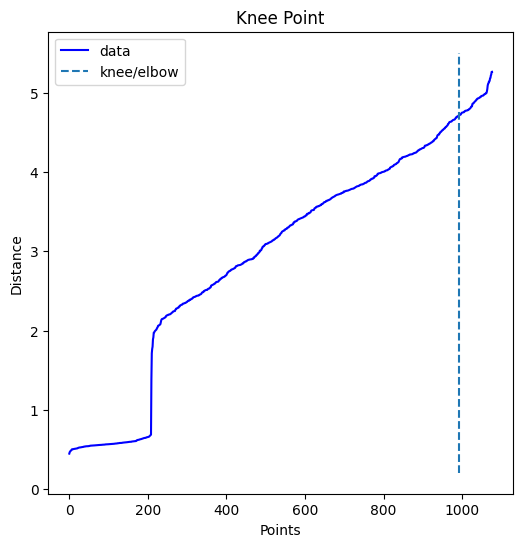

In [ ]:
from kneed import KneeLocator
from sklearn.neighbors import NearestNeighbors

nearest_neighbors = NearestNeighbors(n_neighbors=11)
neighbors = nearest_neighbors.fit(emb)

distances, indices = neighbors.kneighbors(emb)
distances = np.sort(distances[:, 10], axis=0)

i = np.arange(len(distances))
knee = KneeLocator(i, distances, S=1, curve='convex', direction='increasing', interp_method='polynomial')

fig = plt.figure(figsize=(5, 5))
knee.plot_knee()
plt.xlabel("Points")
plt.ylabel("Distance")

print(distances[knee.knee])

In [ ]:
dbscan_cluster = DBSCAN(eps=2.7224987, min_samples=8)
dbscan_cluster.fit(emb)
labels = dbscan_cluster.labels_
print(Counter(labels))

Counter({0: 512, -1: 357, 3: 50, 2: 27, 4: 26, 10: 25, 1: 13, 5: 13, 12: 9, 8: 8, 9: 8, 11: 8, 6: 7, 7: 7, 13: 7})


**MeanShift**

In [ ]:
from sklearn.cluster import MeanShift, estimate_bandwidth

In [ ]:
from tqdm import tqdm

100%|██████████| 23/23 [02:14<00:00,  5.84s/it]


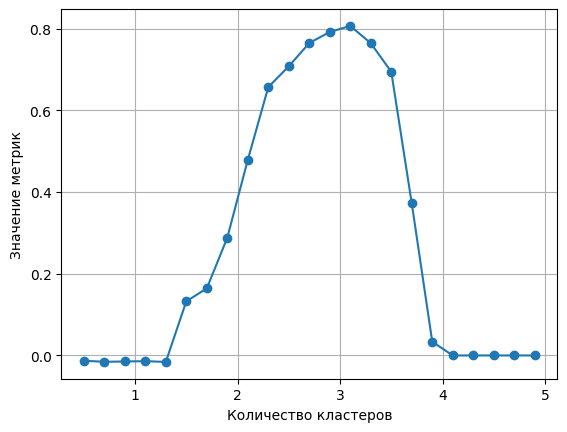

In [ ]:
mod = []
for k in tqdm(np.arange(0.5, 5, 0.2)):
  mean_shift = MeanShift(bandwidth=k).fit(emb)
  labels = mean_shift.labels_
  communities = {}
  for node, label in zip(G_con.nodes(), labels):
    if label not in communities:
      communities[label] = []
    communities[label].append(node)

  # modularity
  mod.append(nx.community.modularity(G_con, communities.values()))

plt.plot(np.arange(0.5, 5, 0.2), mod, '-o') #21
plt.xlabel('Значение bandwidth')
plt.ylabel('Значение метрик')
plt.grid()
plt.show()

In [ ]:
mean_shift = MeanShift(bandwidth=3.1).fit(emb)
labels = mean_shift.labels_
print(Counter(labels))

# labels = res_df['labels'].values

communities = {}
for node, label in zip(G_con.nodes(), labels):
    if label not in communities:
        communities[label] = []
    communities[label].append(node)

# modularity
nx.community.modularity(G_con, communities.values())

Counter({0: 229, 1: 118, 2: 62, 5: 31, 3: 26, 8: 24, 7: 23, 6: 21, 9: 21, 12: 18, 10: 18, 4: 18, 15: 16, 13: 16, 61: 16, 11: 15, 16: 13, 23: 13, 39: 12, 20: 12, 14: 12, 21: 12, 55: 12, 19: 12, 30: 11, 24: 11, 18: 10, 35: 10, 36: 9, 43: 9, 22: 9, 29: 9, 17: 9, 25: 9, 26: 9, 50: 8, 31: 8, 48: 8, 42: 8, 33: 8, 38: 8, 27: 8, 41: 8, 44: 8, 37: 8, 46: 7, 32: 7, 40: 7, 47: 6, 66: 6, 28: 6, 53: 6, 54: 6, 34: 6, 45: 6, 51: 5, 60: 5, 58: 5, 52: 5, 56: 5, 49: 5, 59: 5, 57: 5, 63: 4, 62: 4, 64: 4, 65: 3, 68: 2, 67: 2})


0.8065293500212589

In [ ]:
# цвета
color_map_3 = []
for i in range(len(communities)):
    color_map_3.append('#%06x' % random.randint(0, 0xFFFFFF))

mapping_colors = {i: color for i, color in enumerate(color_map_3)}

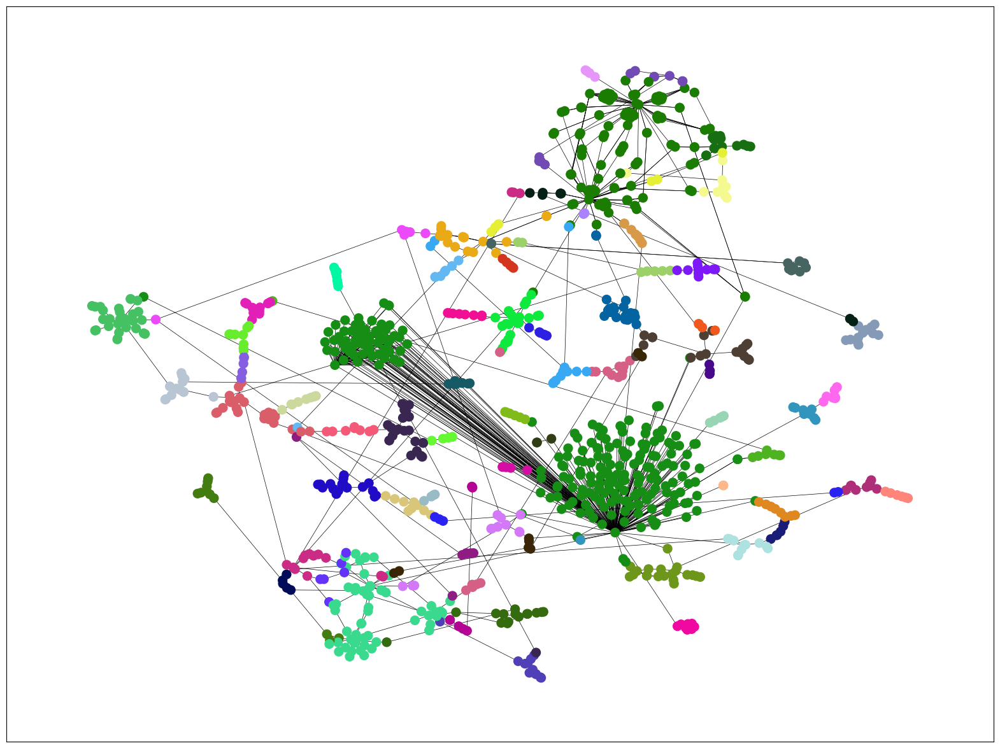

In [ ]:
plt.figure(figsize = (20, 15))
nodes_draw = nx.draw_networkx_nodes(G = G_con, pos = pos_emb,
                       node_color = [mapping_colors[i] for i in labels],
                       node_size = 100)

edges_draw = nx.draw_networkx_edges(G = G_con, pos = pos_emb, width = 0.5)

In [ ]:
# результаты работы после применения GCN
pd.DataFrame([['AffinityPropagation' , 0.78642], ['Kmeans' , 0.801095], ['MeanShift' , 0.80652]], columns = ['метод', 'метрика'])

,метод,метрика
0,AffinityPropagation,0.786420
1,Kmeans,0.801095
2,MeanShift,0.806520


## **Кластеризация с использованием нейронных сетей**

## **Link prediction**

In [ ]:
# Разделить ребра графа на training и testing
u, v = G_dgl.edges()
eids = np.arange(G_dgl.num_edges())
eids = np.random.permutation(eids)
test_size = int(len(eids) * 0.1)
train_size = G_dgl.num_edges() - test_size
test_pos_u, test_pos_v = u[eids[:test_size]], v[eids[:test_size]]
train_pos_u, train_pos_v = u[eids[test_size:]], v[eids[test_size:]]

In [ ]:
# Найти все negative edges и разделить их на training и testing
adj = sp.coo_matrix((np.ones(len(u)), (u.numpy(), v.numpy())))
adj_neg = 1 - adj.todense() - np.eye(G_dgl.num_nodes())
neg_u, neg_v = np.where(adj_neg != 0)

neg_eids = np.random.choice(len(neg_u), G_dgl.num_edges())
test_neg_u, test_neg_v = (
    neg_u[neg_eids[:test_size]],
    neg_v[neg_eids[:test_size]],
)
train_neg_u, train_neg_v = (
    neg_u[neg_eids[test_size:]],
    neg_v[neg_eids[test_size:]],
)

In [ ]:
# удаление ребер для training графа, которые использованы в test
train_g = dgl.remove_edges(G_dgl, eids[:test_size])

In [ ]:
# определим GraphSAGE модель

Строится модель, состоящая из двух слоев GraphSAGE, каждый из которых вычисляет новые представления узлов путем усреднения информации о соседях. DGL предоставляет dgl.nn.SAGEConv, который удобно создает слой GraphSAGE.

In [ ]:
from dgl.nn import SAGEConv

# build a two-layer GraphSAGE model
class GraphSAGE(nn.Module):
    def __init__(self, in_feats, h_feats):
        super(GraphSAGE, self).__init__()
        self.conv1 = SAGEConv(in_feats, h_feats, "mean")
        self.conv2 = SAGEConv(h_feats, h_feats, "mean")

    def forward(self, g, in_feat):
        h = self.conv1(g, in_feat)
        h = F.relu(h)
        h = self.conv2(g, h)
        return h

In [ ]:
# Создание positive graph и negative graph for training и testing

train_pos_g = dgl.graph((train_pos_u, train_pos_v), num_nodes=G_dgl.num_nodes())
train_neg_g = dgl.graph((train_neg_u, train_neg_v), num_nodes=G_dgl.num_nodes())

test_pos_g = dgl.graph((test_pos_u, test_pos_v), num_nodes=G_dgl.num_nodes())
test_neg_g = dgl.graph((test_neg_u, test_neg_v), num_nodes=G_dgl.num_nodes())

In [ ]:
import dgl.function as fn

class DotPredictor(nn.Module):
    def forward(self, g, h):
        with g.local_scope():
            g.ndata["h"] = h
            # Compute a new edge feature named 'score' by a dot-product between the
            # source node feature 'h' and destination node feature 'h'.
            g.apply_edges(fn.u_dot_v("h", "h", "score"))
            # u_dot_v returns a 1-element vector for each edge so you need to squeeze it.
            return g.edata["score"][:, 0]

In [ ]:
class MLPPredictor(nn.Module):
    def __init__(self, h_feats):
        super().__init__()
        self.W1 = nn.Linear(h_feats * 2, h_feats)
        self.W2 = nn.Linear(h_feats, 1)

    def apply_edges(self, edges):
        """
        Функция вычисляет скалярную оценку для каждого ребра данного графа.
        edges :
            Имеет три части ``src``, ``dst`` and ``data``, каждая из которых
            представляет собой словарь с признаками source nodes,
            the destination nodes, and the edges themselves.

        Returns
        dict
            A dictionary of new edge features.
        """
        h = torch.cat([edges.src["h"], edges.dst["h"]], 1)
        return {"score": self.W2(F.relu(self.W1(h))).squeeze(1)}

    def forward(self, g, h):
        with g.local_scope():
            g.ndata["h"] = h
            g.apply_edges(self.apply_edges)
            return g.edata["score"]

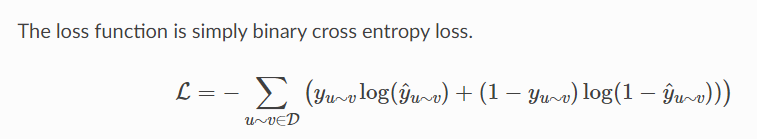

In [ ]:
def compute_loss(pos_score, neg_score):
    scores = torch.cat([pos_score, neg_score])
    labels = torch.cat(
        [torch.ones(pos_score.shape[0]), torch.zeros(neg_score.shape[0])]
    )
    return F.binary_cross_entropy_with_logits(scores, labels)

In [ ]:
def compute_auc(pos_score, neg_score):
    scores = torch.cat([pos_score, neg_score]).numpy()
    labels = torch.cat(
        [torch.ones(pos_score.shape[0]), torch.zeros(neg_score.shape[0])]
    ).numpy()
    return roc_auc_score(labels, scores)

In [ ]:
model = GraphSAGE(train_g.ndata["data"].shape[1], 16)
pred = DotPredictor()

In [ ]:
# ----------- 3. set up loss and optimizer -------------- #
optimizer = torch.optim.Adam(
    itertools.chain(model.parameters(), pred.parameters()), lr=0.001
)

In [ ]:

# ----------- 4. training -------------------------------- #
all_logits = []
for e in range(500):
    # forward
    h = model(train_g, train_g.ndata["data"])
    # h.shape : [2708, 16]
    pos_score = pred(train_pos_g, h)
    neg_score = pred(train_neg_g, h)
    loss = compute_loss(pos_score, neg_score)

    # backward
    optimizer.zero_grad()
    loss.backward()
    optimizer.step()

    if e % 50 == 0:
        print("In epoch {}, loss: {}".format(e, loss))

In epoch 0, loss: 0.47679564356803894
In epoch 50, loss: 0.4639909863471985
In epoch 100, loss: 0.45273885130882263
In epoch 150, loss: 0.4423961341381073
In epoch 200, loss: 0.4331059753894806
In epoch 250, loss: 0.42474284768104553
In epoch 300, loss: 0.41702982783317566
In epoch 350, loss: 0.4100896120071411
In epoch 400, loss: 0.4037197530269623
In epoch 450, loss: 0.39785030484199524


In [ ]:
# ----------- 5. check results ------------------------ #
from sklearn.metrics import roc_auc_score

with torch.no_grad():
    pos_score = pred(test_pos_g, h)
    neg_score = pred(test_neg_g, h)
    print("AUC", compute_auc(pos_score, neg_score))

AUC 0.8206588327021609


In [ ]:
# получить embeddings
node_embeddings = model(G_dgl, G_dgl.ndata["data"]).detach().numpy()

In [ ]:
# pos на основе embeddings после модели GCN
tsne = TSNE(n_components = 2)
pos_embeddings = tsne.fit_transform(node_embeddings)
pos_emb = dict(zip(G_con.nodes, pos_embeddings))

In [ ]:
data_for_model = torch.stack(list(nx.get_node_attributes(G = G_con, name = 'data').values()))

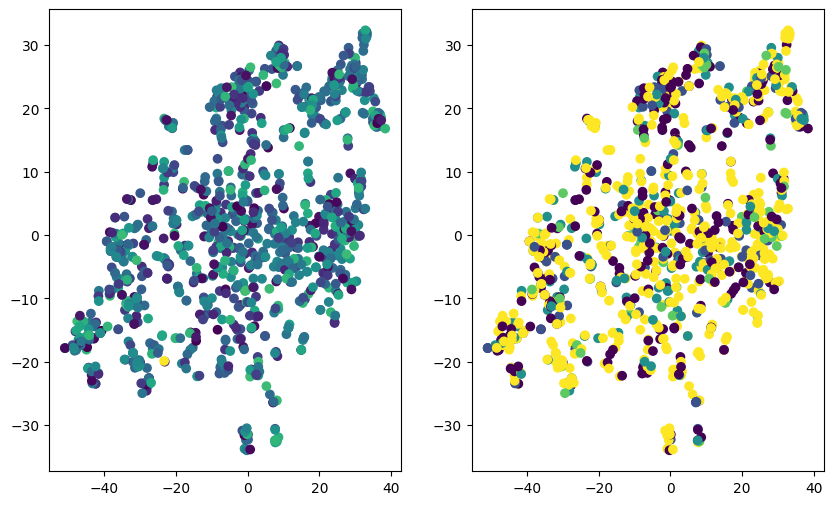

In [ ]:
plt.figure(figsize=(10, 6))
plt.subplot(121)
plt.scatter(pos_embeddings[:, 0], pos_embeddings[:, 1], c = data_for_model[:, 0])

plt.subplot(122)
plt.scatter(pos_embeddings[:, 0], pos_embeddings[:, 1], c = data_for_model[:, 3])
plt.show()

In [ ]:
# цвета
color_map_3 = []
for i in range(55):
    color_map_3.append('#%06x' % random.randint(0, 0xFFFFFF))

mapping_colors = {i: color for i, color in enumerate(color_map_3)}

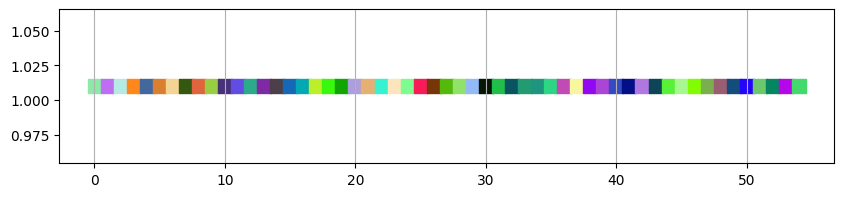

In [ ]:
plt.figure(figsize = (10, 2))
x = range(55)
y = [1.01 for i in range(55)]

plt.scatter(x, y, color=color_map_3, s=100, marker = 's')
plt.grid(axis = 'x')
plt.show()

Методы для кластеразации:
* K-Means
* Affinity propagation
* Mean-shift

In [ ]:
from sklearn.cluster import KMeans # param: n_clusters, init = {‘k-means++’, ‘random’}
from sklearn.cluster import AffinityPropagation
from sklearn.cluster import MeanShift, SpectralClustering
from sklearn.cluster import AgglomerativeClustering # n_clusters
from sklearn.cluster import DBSCAN

**AffinityPropagation**

In [ ]:
Preference = [-900, -800, -700, -600, -500, -400, -350, -200, -150]
mod = []
number_clusters = []
for preference in Preference:
    model = AffinityPropagation(preference=preference, random_state=42)
    model.fit(node_embeddings)
    labels = model.labels_

    communities = {}
    for node, label in zip(G_con.nodes(), labels):
      if label not in communities:
        communities[label] = []
      communities[label].append(node)
    number_clusters.append(len(communities))
    # modularity
    mod.append(nx.community.modularity(G_con, communities.values()))

/usr/local/lib/python3.10/dist-packages/sklearn/cluster/_affinity_propagation.py:143: ConvergenceWarning: Affinity propagation did not converge, this model may return degenerate cluster centers and labels.
  warnings.warn(


In [ ]:
number_clusters

[10, 10, 13, 16, 20, 554, 23, 35, 38]

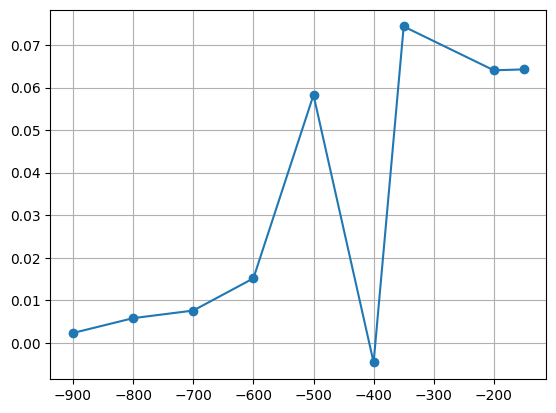

In [ ]:
plt.plot(Preference, mod, '-o')
plt.grid()
plt.show()

In [ ]:
# выберем preference = -500 при котором 18 кластера

In [ ]:
# n_clusters = 18
af = AffinityPropagation(
    preference= -350,
    random_state=42).fit(node_embeddings)

labels = af.labels_
print(Counter(labels))

Counter({4: 399, 11: 276, 5: 152, 15: 146, 8: 20, 14: 16, 22: 13, 1: 12, 18: 12, 0: 5, 2: 4, 13: 4, 16: 4, 17: 3, 9: 3, 3: 1, 6: 1, 7: 1, 10: 1, 12: 1, 19: 1, 20: 1, 21: 1})


In [ ]:
communities = {}
for node, label in zip(G_con.nodes(), labels):
    if label not in communities:
        communities[label] = []
    communities[label].append(node)

# modularity
nx.community.modularity(G_con, communities.values())

0.07436434860402497

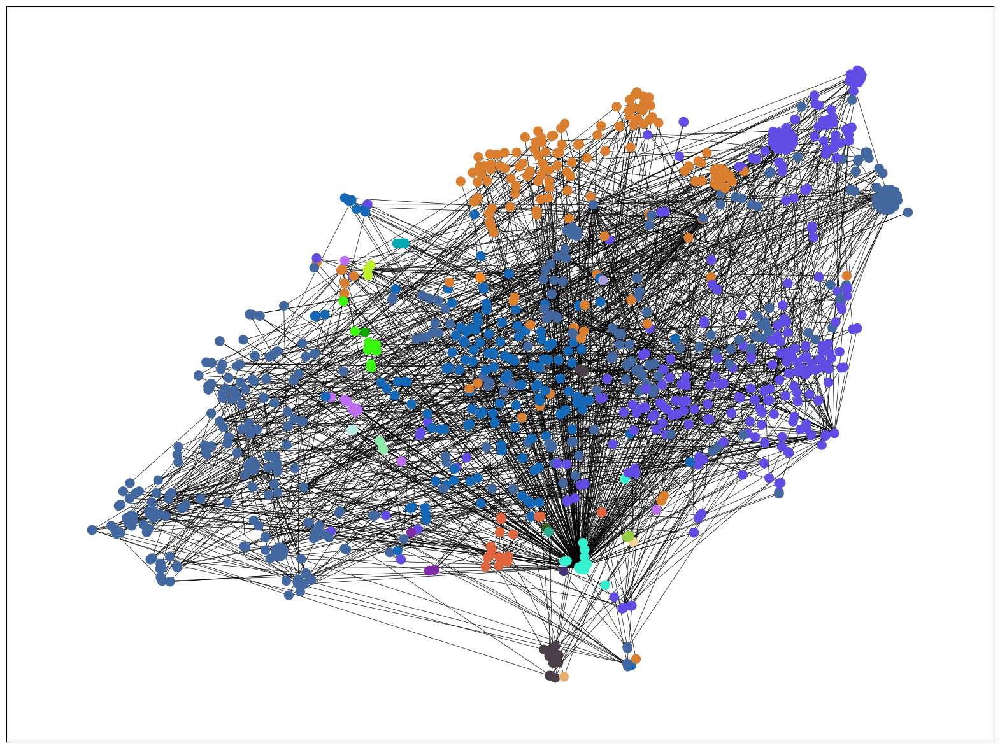

In [ ]:
plt.figure(figsize = (20, 15))
nodes_draw = nx.draw_networkx_nodes(G = G_con, pos = pos_emb,
                       node_color = [mapping_colors[i] for i in labels],
                       node_size = 100)

edges_draw = nx.draw_networkx_edges(G = G_con, pos = pos_emb, width = 0.5)

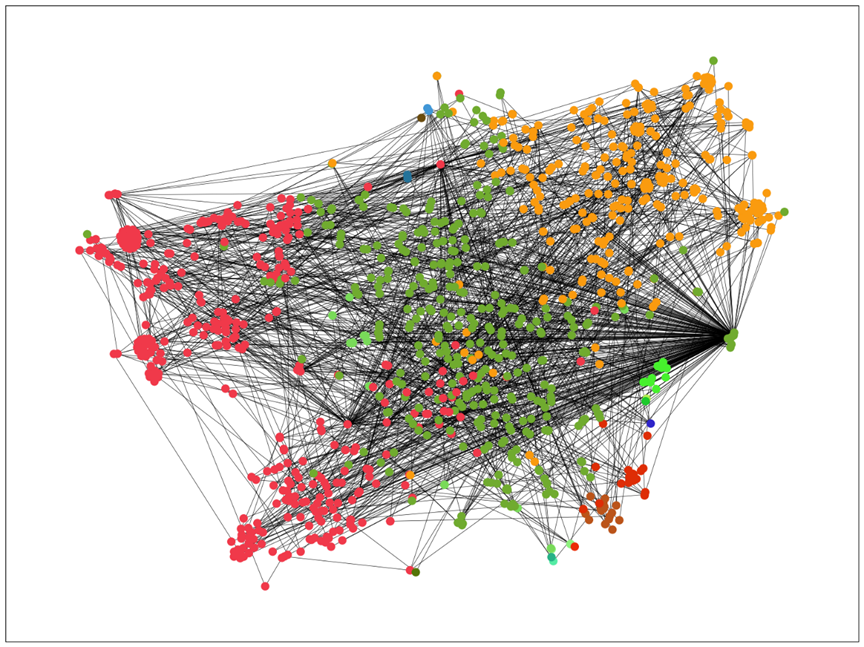

In [ ]:
res_df2 = pd.DataFrame({'company': list(G_con.nodes()), 'labels': labels})
res_df2['inn'] = res_df2['company'].apply(lambda x: companies_lst[x])

In [ ]:
lst_inn_1 = res_df2.where(res_df2['labels'] == 4).dropna()['inn'].values
dfd_1 = data.where(data['INN'].isin(lst_inn_1)).dropna()[['2023, Чистая прибыль (убыток), RUB', '2023, EBIT, RUB', '2023, Выручка, RUB', '2023, Валовая рентабельность, %', '2023, Коэффициент текущей ликвидности, %']].describe().iloc[1:3]

lst_inn_2 = res_df2.where(res_df2['labels'] == 11).dropna()['inn'].values
dfd_2 = data.where(data['INN'].isin(lst_inn_2)).dropna()[['2023, Чистая прибыль (убыток), RUB', '2023, EBIT, RUB', '2023, Выручка, RUB', '2023, Валовая рентабельность, %', '2023, Коэффициент текущей ликвидности, %']].describe().iloc[1:3]

lst_inn_3 = res_df2.where(res_df2['labels'] == 5).dropna()['inn'].values
dfd_3 = data.where(data['INN'].isin(lst_inn_3)).dropna()[['2023, Чистая прибыль (убыток), RUB', '2023, EBIT, RUB', '2023, Выручка, RUB', '2023, Валовая рентабельность, %', '2023, Коэффициент текущей ликвидности, %']].describe().iloc[1:3]

lst_inn_4 = res_df2.where(res_df2['labels'] == 15).dropna()['inn'].values
dfd_4 = data.where(data['INN'].isin(lst_inn_4)).dropna()[['2023, Чистая прибыль (убыток), RUB', '2023, EBIT, RUB', '2023, Выручка, RUB', '2023, Валовая рентабельность, %', '2023, Коэффициент текущей ликвидности, %']].describe().iloc[1:3]

# lst_inn_5 = res_df2.where(res_df2['labels'] == 49).dropna()['inn'].values
# dfd_5 = data.where(data['INN'].isin(lst_inn_5)).dropna()[['2023, Чистая прибыль (убыток), RUB', '2023, EBIT, RUB', '2023, Выручка, RUB', '2023, Валовая рентабельность, %', '2023, Коэффициент текущей ликвидности, %']].describe().iloc[1:3]

In [ ]:
pd.concat([dfd_1, dfd_2, dfd_3, dfd_4], keys = [4, 11, 5, 15]).style.background_gradient(cmap = cm)

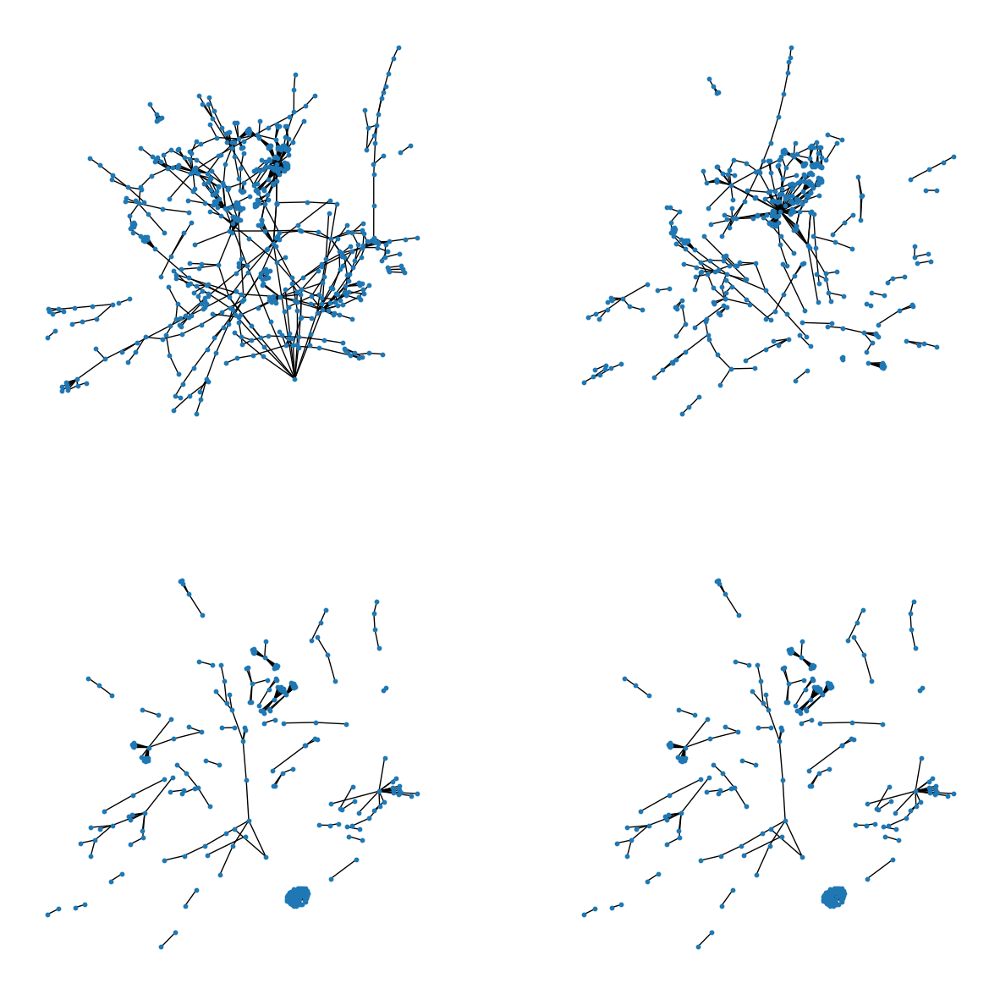

In [ ]:
plt.figure(figsize=(15, 15))
plt.subplot(221)
companies_lst_subgraph = dict(np.concatenate(
    (links[links['ИНН'].isin(lst_inn_1)][['Проверяемые объекты', 'ИНН']],
     links[links['ИНН'].isin(lst_inn_1)][['Контрольные объекты', 'ИНН.1']])
  )).keys()

nx.draw(G_con.subgraph(companies_lst_subgraph), pos = pos_main, node_size = 10)

plt.subplot(222)
companies_lst_subgraph_2 = dict(np.concatenate(
    (links[links['ИНН'].isin(lst_inn_2)][['Проверяемые объекты', 'ИНН']],
     links[links['ИНН'].isin(lst_inn_2)][['Контрольные объекты', 'ИНН.1']])
  )).keys()

nx.draw(G_con.subgraph(companies_lst_subgraph_2), pos = pos_main, node_size = 10)

plt.subplot(223)
companies_lst_subgraph_3 = dict(np.concatenate(
    (links[links['ИНН'].isin(lst_inn_3)][['Проверяемые объекты', 'ИНН']],
     links[links['ИНН'].isin(lst_inn_3)][['Контрольные объекты', 'ИНН.1']])
  )).keys()

nx.draw(G_con.subgraph(companies_lst_subgraph_3), pos = pos_main, node_size = 10)

plt.subplot(224)
companies_lst_subgraph_4 = dict(np.concatenate(
    (links[links['ИНН'].isin(lst_inn_3)][['Проверяемые объекты', 'ИНН']],
     links[links['ИНН'].isin(lst_inn_3)][['Контрольные объекты', 'ИНН.1']])
  )).keys()

nx.draw(G_con.subgraph(companies_lst_subgraph_4), pos = pos_main, node_size = 10)

**KMeans**

In [ ]:
mod = []
for k in range(1, 40, 2):
  kmeans = KMeans(n_clusters=k, random_state = 42, algorithm = 'elkan').fit(node_embeddings)
  labels = kmeans.labels_
  communities = {}
  for node, label in zip(G_con.nodes(), labels):
    if label not in communities:
      communities[label] = []
    communities[label].append(node)

  # modularity
  mod.append(nx.community.modularity(G_con, communities.values()))

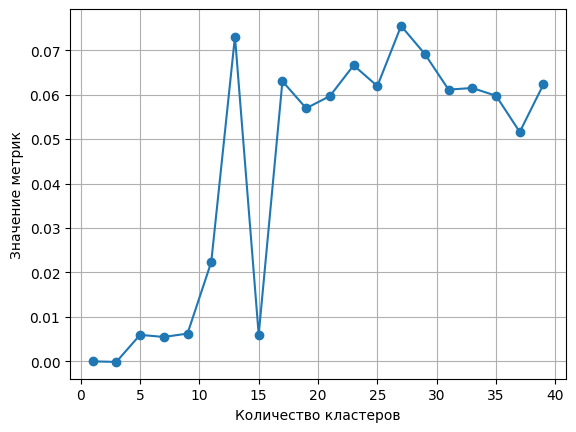

In [ ]:
plt.plot(range(1, 40, 2), mod, '-o') #21
plt.xlabel('Количество кластеров')
plt.ylabel('Значение метрик')
plt.grid()
plt.show()

In [ ]:
# выберем n_clusters = 18

In [ ]:
kmeans = KMeans(n_clusters=13, random_state = 42, algorithm='elkan')
labels = kmeans.fit_predict(node_embeddings)
print(Counter(labels))

/usr/local/lib/python3.10/dist-packages/sklearn/cluster/_kmeans.py:870: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  warnings.warn(


Counter({12: 524, 1: 465, 4: 38, 0: 23, 9: 15, 11: 3, 3: 3, 5: 1, 7: 1, 2: 1, 6: 1, 10: 1, 8: 1})


In [ ]:
# labels = res_df['labels'].values

communities = {}
for node, label in zip(G_con.nodes(), labels):
    if label not in communities:
        communities[label] = []
    communities[label].append(node)

# modularity
nx.community.modularity(G_con, communities.values())

0.07305728280895696

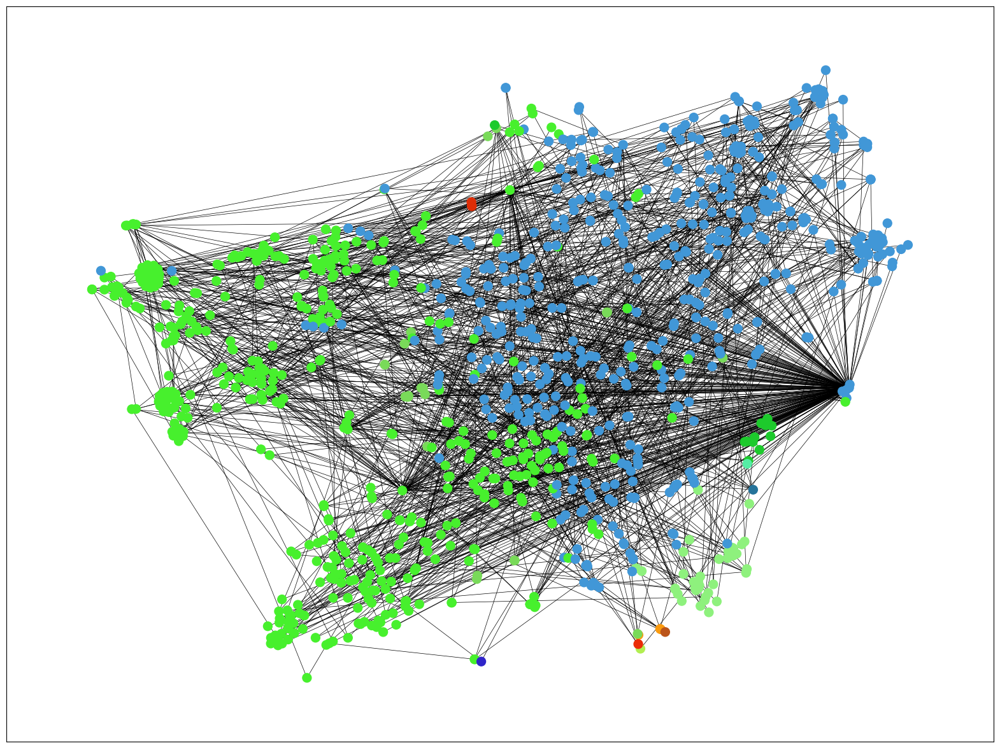

In [ ]:
plt.figure(figsize = (20, 15))
nodes_draw = nx.draw_networkx_nodes(G = G_con, pos = pos_emb,
                       node_color = [mapping_colors[i] for i in labels],
                       node_size = 100)

edges_draw = nx.draw_networkx_edges(G = G_con, pos = pos_emb, width = 0.5)

**DBSCAN**

In [ ]:
!pip install kneed

4.433709473296995


<Figure size 500x500 with 0 Axes>

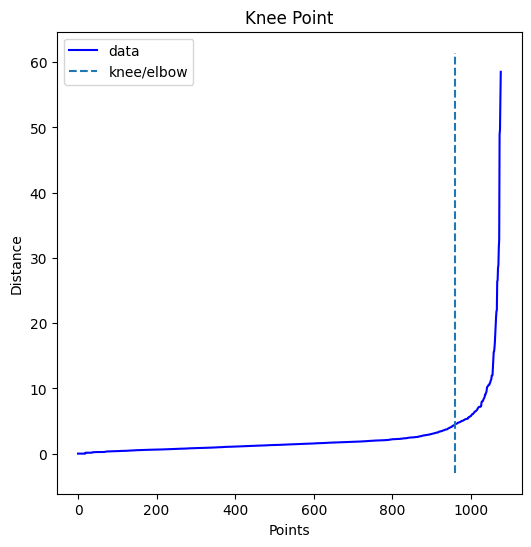

In [ ]:
from kneed import KneeLocator
from sklearn.neighbors import NearestNeighbors

nearest_neighbors = NearestNeighbors(n_neighbors=11)
neighbors = nearest_neighbors.fit(node_embeddings)

distances, indices = neighbors.kneighbors(node_embeddings)
distances = np.sort(distances[:, 10], axis=0)

i = np.arange(len(distances))
knee = KneeLocator(i, distances, S=1, curve='convex', direction='increasing', interp_method='polynomial')

fig = plt.figure(figsize=(5, 5))
knee.plot_knee()
plt.xlabel("Points")
plt.ylabel("Distance")

print(distances[knee.knee])

In [ ]:
dbscan_cluster = DBSCAN(eps=0.163, min_samples=8)
dbscan_cluster.fit(node_embeddings)
labels = dbscan_cluster.labels_
print(Counter(labels))

Counter({-1: 1018, 0: 19, 3: 17, 1: 15, 2: 8})


**MeanShift**

In [ ]:
from sklearn.cluster import MeanShift, estimate_bandwidth

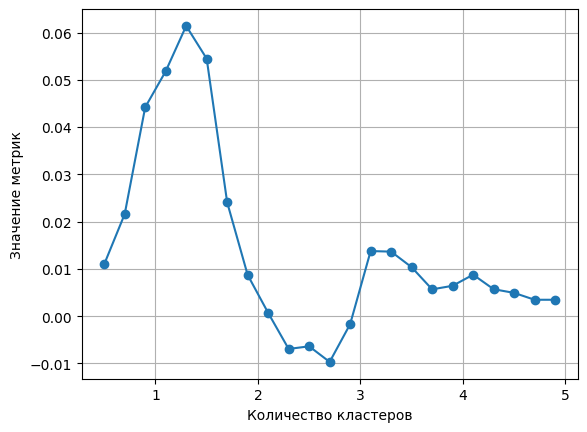

In [ ]:
mod = []
for k in np.arange(0.5, 5, 0.2):
  mean_shift = MeanShift(bandwidth=k).fit(node_embeddings)
  labels = mean_shift.labels_
  communities = {}
  for node, label in zip(G_con.nodes(), labels):
    if label not in communities:
      communities[label] = []
    communities[label].append(node)

  # modularity
  mod.append(nx.community.modularity(G_con, communities.values()))

plt.plot(np.arange(0.5, 5, 0.2), mod, '-o') #21
plt.xlabel('Количество кластеров')
plt.ylabel('Значение метрик')
plt.grid()
plt.show()

In [ ]:
mean_shift = MeanShift(bandwidth=1.3).fit(node_embeddings)
labels = mean_shift.labels_
print(Counter(labels))

# labels = res_df['labels'].values

communities = {}
for node, label in zip(G_con.nodes(), labels):
    if label not in communities:
        communities[label] = []
    communities[label].append(node)

# modularity
nx.community.modularity(G_con, communities.values())

Counter({0: 195, 1: 180, 2: 37, 3: 30, 4: 26, 6: 15, 9: 14, 171: 9, 29: 9, 223: 8, 267: 8, 25: 8, 11: 7, 135: 7, 5: 7, 16: 6, 18: 6, 289: 6, 15: 6, 7: 6, 8: 6, 10: 5, 12: 5, 28: 5, 292: 5, 263: 4, 36: 4, 233: 4, 228: 4, 17: 4, 24: 4, 35: 4, 20: 3, 43: 3, 182: 3, 176: 3, 13: 3, 202: 3, 203: 3, 281: 3, 42: 3, 14: 3, 325: 3, 316: 3, 19: 3, 226: 3, 319: 3, 287: 2, 44: 2, 22: 2, 138: 2, 306: 2, 164: 2, 284: 2, 286: 2, 190: 2, 274: 2, 338: 2, 23: 2, 302: 2, 167: 2, 37: 2, 311: 2, 40: 2, 201: 2, 45: 2, 49: 2, 107: 2, 246: 2, 239: 2, 324: 2, 47: 2, 27: 2, 41: 2, 159: 2, 46: 2, 34: 2, 278: 2, 262: 2, 33: 2, 293: 2, 32: 2, 169: 2, 21: 2, 247: 2, 38: 2, 39: 2, 31: 2, 26: 2, 304: 2, 48: 2, 30: 2, 242: 2, 198: 1, 120: 1, 299: 1, 227: 1, 354: 1, 270: 1, 197: 1, 279: 1, 140: 1, 363: 1, 75: 1, 301: 1, 145: 1, 359: 1, 112: 1, 73: 1, 142: 1, 276: 1, 220: 1, 291: 1, 82: 1, 104: 1, 232: 1, 207: 1, 137: 1, 273: 1, 119: 1, 151: 1, 147: 1, 86: 1, 156: 1, 118: 1, 98: 1, 174: 1, 149: 1, 179: 1, 154: 1, 83: 1, 

0.06139527751204655

In [ ]:
# цвета
color_map_3 = []
for i in range(len(communities)):
    color_map_3.append('#%06x' % random.randint(0, 0xFFFFFF))

mapping_colors = {i: color for i, color in enumerate(color_map_3)}

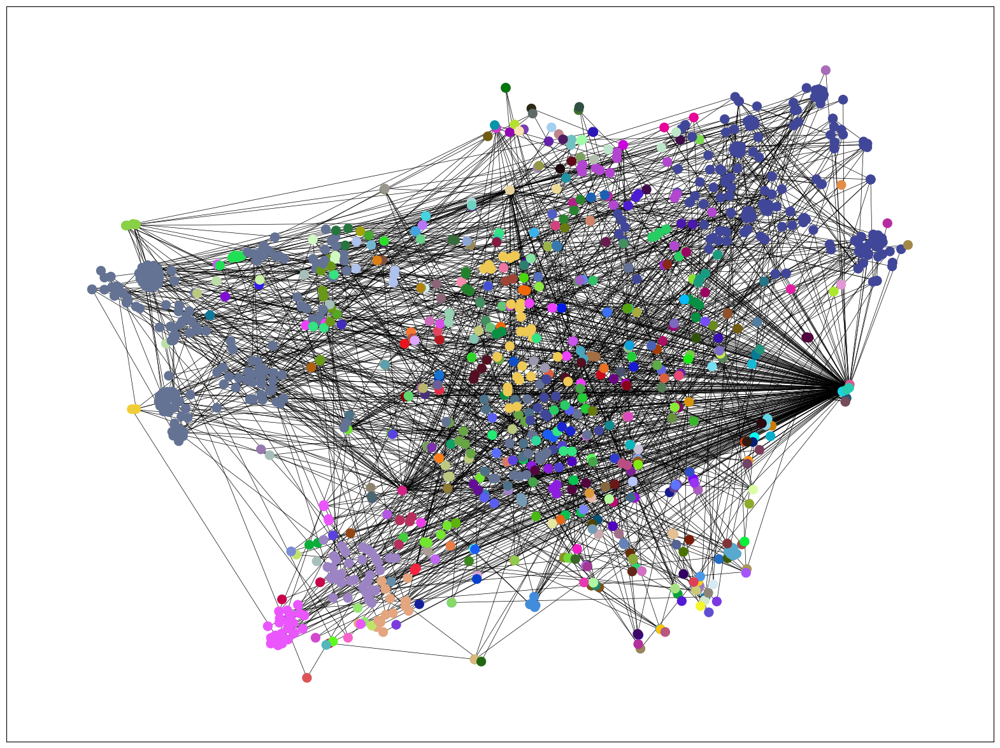

In [ ]:
plt.figure(figsize = (20, 15))
nodes_draw = nx.draw_networkx_nodes(G = G_con, pos = pos_emb,
                       node_color = [mapping_colors[i] for i in labels],
                       node_size = 100)

edges_draw = nx.draw_networkx_edges(G = G_con, pos = pos_emb, width = 0.5)

In [ ]:
# результаты работы после применения GCN
pd.DataFrame([['AffinityPropagation' , 0.08545], ['Kmeans' , 0.073057], ['MeanShift' , 0.06139]])

,0,1
0,AffinityPropagation,0.085450
1,Kmeans,0.073057
2,MeanShift,0.061390
